In [43]:
import numpy as np
import matplotlib.pyplot as plt
import scipy
from tifffile import imread
import os
from scipy.stats import sem
from matplotlib.colors import LinearSegmentedColormap
from scipy.stats import gaussian_kde


In [3]:
ls

140nM/                          ControlvsOpsin_side.svg
140nM_hist_f1.svg               GliaTimeScalesFinal_side.ipynb
35nM/                           sideWaveAllFish_median.svg
7nM/                            unused/


In [18]:
def load_all_files_in_folder(folder_path):
    
    data = {}
    
    # List all files in the folder
    for filename in os.listdir(folder_path):
        file_path = os.path.join(folder_path, filename)
        
        # Check if it's a .npy file
        if filename.endswith('.npy'):
            # Load the .npy file
            data[filename] = np.load(file_path)
    
    return data


## 140 nM

F2_140nM_t1.tif (300, 1024, 1024)
F2_140nM_t2.tif (600, 1024, 1024)
F3_140nM_t1.tif (600, 1024, 1024)
F3_140nM_t2.tif (600, 1024, 1024)
F3_140nM_t3.tif (600, 1024, 1024)
F4_140nM_t1 - 1.tif (600, 1024, 1024)
F4_140nM_t2.tif (600, 1024, 1024)
F4_140nM_t3.tif (600, 1024, 1024)
F5_140nM_t2.tif (600, 1024, 1024)


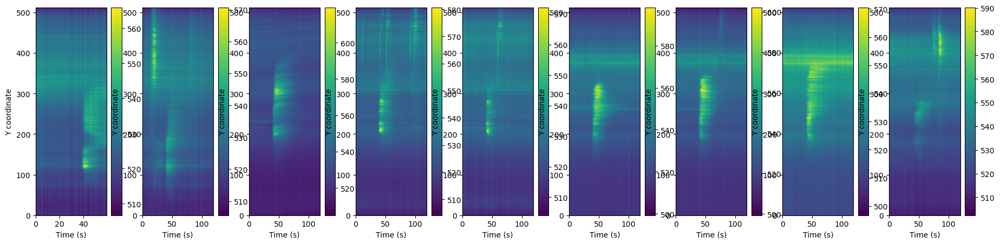

In [350]:
#Input and visualization of the data (x-averaged plots)

path = "140nM"
waves = np.sort(os.listdir(path))[1:]
len(waves)

WAVES = []
TIMES = []

plt.figure(figsize = (25, 5))
i=1

for filename in np.sort(os.listdir(path))[1:-1]:

    wave = imread(path + '/' + filename)

    #wave = (wave - np.mean(wave[0:800, :, :]))/np.mean(wave[0:800, :, :])

    times = np.linspace(0,len(wave[:,0,0])*0.2,len(wave[:,0,0])+1)
    times = times[:-1]
    TIMES.append(times)
    
    print(filename, np.shape(wave)) 
    plt.subplot(1, len(waves), i)
    i = i+1
    plt.imshow(np.mean(wave, axis=2).T, aspect='auto', extent=[0, np.max(times), 0, 512])
    plt.colorbar()
    plt.xlabel("Time (s)")
    plt.ylabel("Y coordinate")
    WAVES.append(wave)

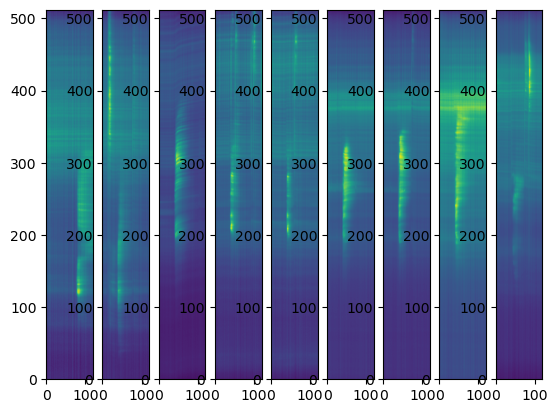

In [352]:
#Remove saturated frames
saturated_threshold = 255

# Process each TIFF file
for w in range(0, len(WAVES)):

    # Calculate the mean image
    mean_image = np.mean(WAVES[w][9:11,:,:], axis=0)

    for i in range(0, len(WAVES[w])):
        
        frame = WAVES[w][i,100:200,100:200]
        
        if np.all(frame == frame[0]):
            #print(w, ' -> ',i)
            WAVES[w][i,:,:] = mean_image

    plt.subplot(1, len(WAVES), w+1)
    plt.imshow(np.mean(WAVES[w], axis=2).T, aspect='auto', extent=[0, np.max(times), 0, 512])


/var/folders/1w/c82l1gs16tbfqhkg5hbpwkp00000gp/T/ipykernel_90661/1406623254.py:20: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  tau1[i,j] = half_max_time_r[0] + half_max_time_l[0]


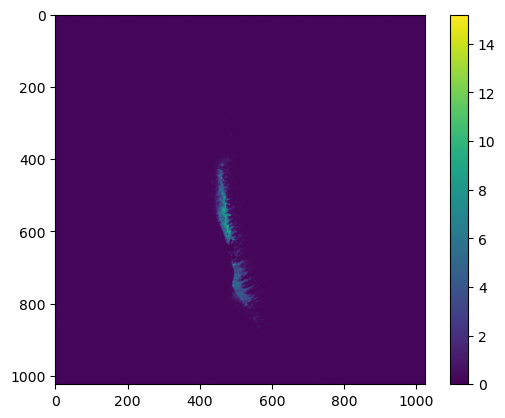

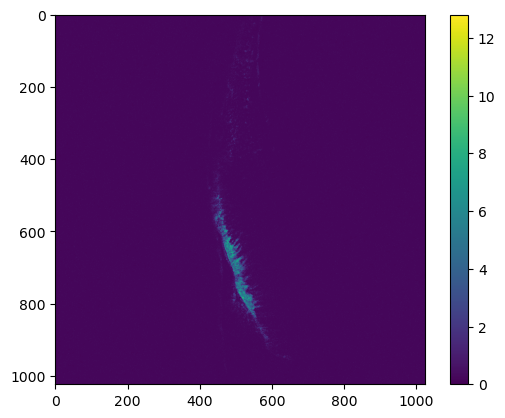

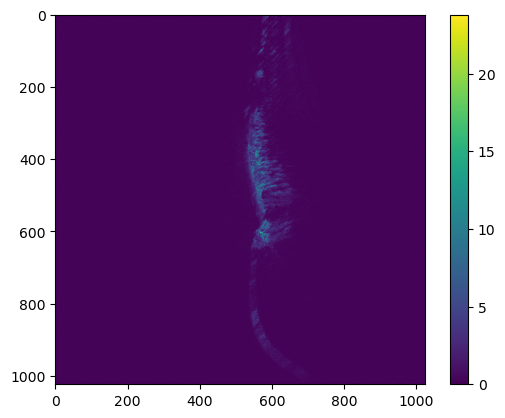

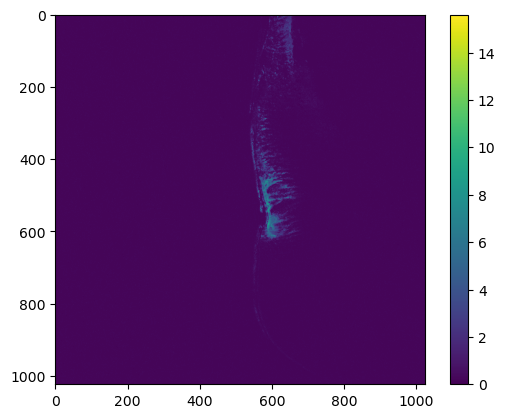

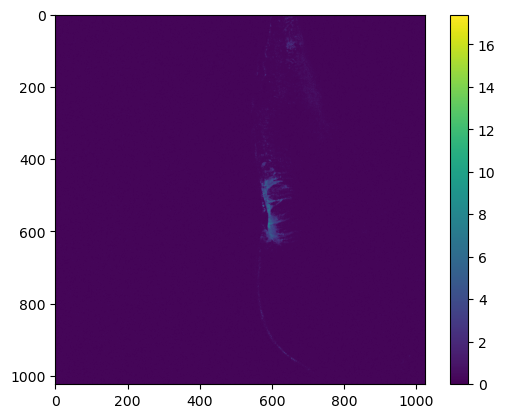

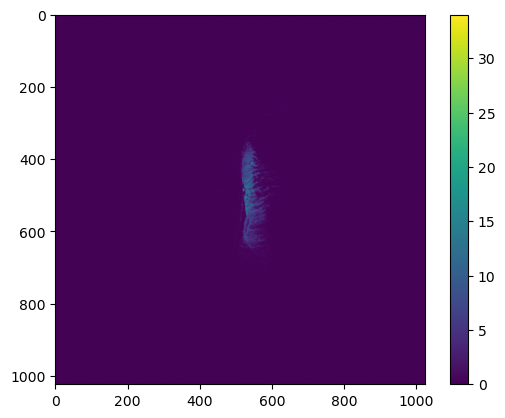

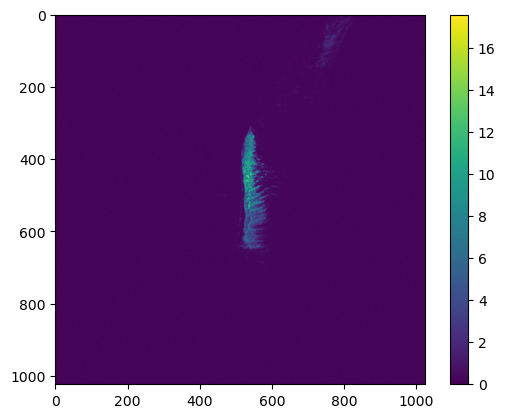

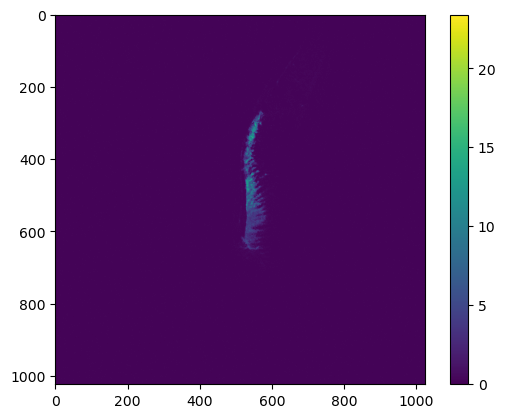

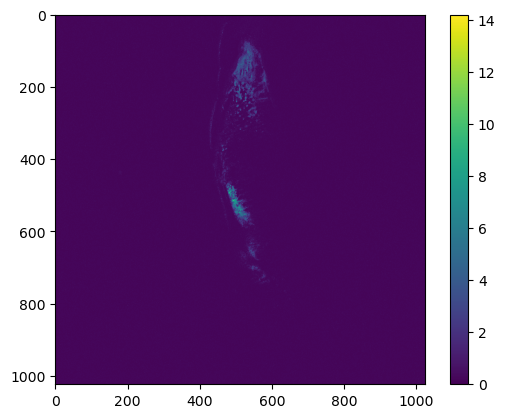

In [354]:
time_maps = []

for w in range(0, len(WAVES)):
    
    tau1 = np.zeros(np.shape(WAVES[w][0, :, :]))
    m1 = np.nanmean(WAVES[w][0:100, :,:], axis = 0)
    #m1 = np.mean(m1)

    for i in range(0, len(WAVES[w][0, :, 0])):
        for j in range(0, len(WAVES[w][0, 0, :])):
                   
            y1 = WAVES[w][150:, i, j] - m1[i,j]
            max_time1 = np.argmax(y1)

            half_max_time_r = np.argwhere(y1[max_time1:] < y1[max_time1]/2)
            half_max_time_l = np.argwhere(y1[:max_time1] < y1[max_time1]/2)

         #Sum the two values to get width at half max
            if(len(half_max_time_r) > 0 and len(half_max_time_l) > 0):
                tau1[i,j] = half_max_time_r[0] + half_max_time_l[0]
            else:
                tau1[i,j] = 0

    tau1[tau1<0] = 0
    tau1[tau1>500] = 0
    tau1 = tau1*0.2

    plt.imshow(tau1)
    plt.colorbar()
    plt.show()

    time_maps.append(tau1)


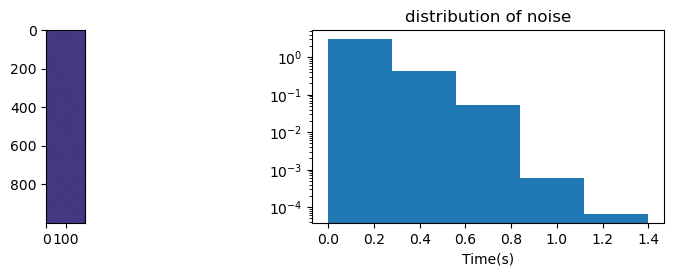

In [355]:
T_1 = np.array(time_maps)
plt.figure(figsize=(10, 2.5))
plt.subplot(121)
plt.imshow(T_1[1, :1000, :200])
plt.subplot(122)
plt.hist(T_1[:, :1000, :200].flatten(), bins = 5, density=True)
plt.yscale('log')
plt.title("distribution of noise")
plt.xlabel("Time(s)")
plt.show()

In [358]:
names = np.sort(os.listdir(path))[1:-1]
print(names[:2])
max_noise = .8


['F2_140nM_t1.tif' 'F2_140nM_t2.tif']


In [363]:
names

array(['F2_140nM_t1.tif', 'F2_140nM_t2.tif', 'F3_140nM_t1.tif',
       'F3_140nM_t2.tif', 'F3_140nM_t3.tif', 'F4_140nM_t1 - 1.tif',
       'F4_140nM_t2.tif', 'F4_140nM_t3.tif', 'F5_140nM_t2.tif'],
      dtype='<U19')

### Fish 1

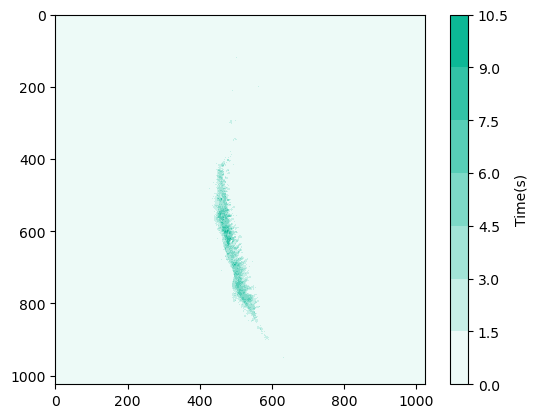

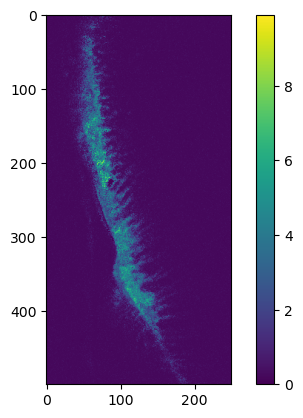

2.7605063109581183 0.012516626958359417


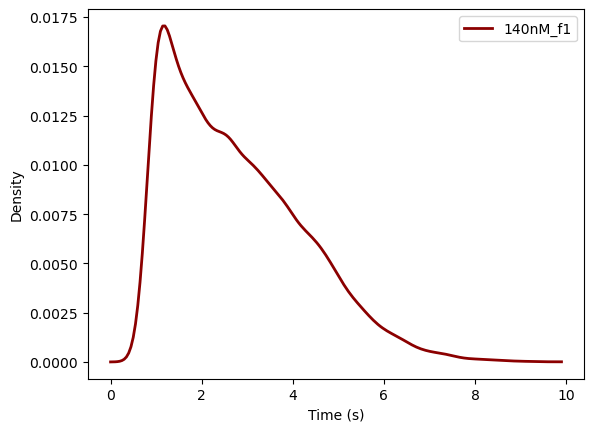

In [361]:
Z = np.median(T_1[0:2], axis = 0)
Z1 = np.median(T_1[0:2], axis = 0)
x = np.linspace(0, np.shape(Z)[1], np.shape(Z)[1])
y = np.linspace(0, np.shape(Z)[0], np.shape(Z)[0])

X, Y = np.meshgrid(x, y)


hex_color = "#09b795"

# Create a gradient colormap: from white to your color
cmap = LinearSegmentedColormap.from_list("my_cmap", ["#ffffff", hex_color])
plt.imshow(Z1, cmap =cmap)

plt.contourf(X, Y, Z1, levels = 7, cmap=cmap, vmax = np.max(Z1))
plt.colorbar(label = 'Time(s)')
    
#plt.savefig("sideWaveAllFish_median.svg")
plt.show()

data_opsin = Z1[400:900, 400:650]
plt.imshow(data_opsin)
plt.colorbar()
plt.show()

kde_bottom = gaussian_kde(data_opsin[data_opsin>max_noise])
x_vals_bottom = np.linspace(0, np.max(data_opsin), 200)
kde_vals_bottom = kde_bottom(x_vals_bottom)/np.sum(kde_bottom(x_vals_bottom))


# Plot smooth KDE curve
plt.plot(x_vals_bottom, kde_vals_bottom, color="darkred", linewidth=2, label="140nM_f1")

plt.legend()
plt.xlabel("Time (s)")
plt.ylabel("Density")
#plt.xlim(0, 0.6)
#plt.yscale('log')
plt.savefig("140nM_hist_f1.svg")


print(np.mean(data_opsin[data_opsin>max_noise]), sem(data_opsin[data_opsin>max_noise]))

### Fish 3

In [47]:
names[2:5]

array(['F3_140nM_t1.tif', 'F3_140nM_t2.tif', 'F3_140nM_t3.tif'],
      dtype='<U19')

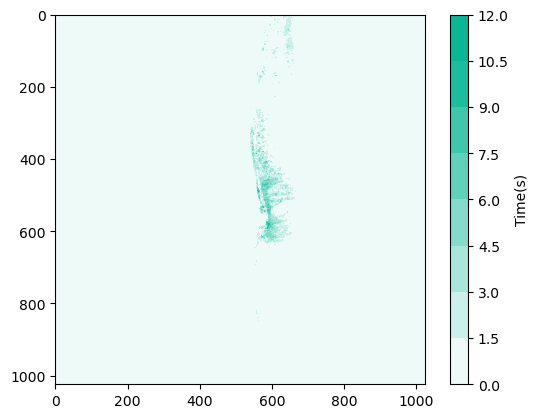

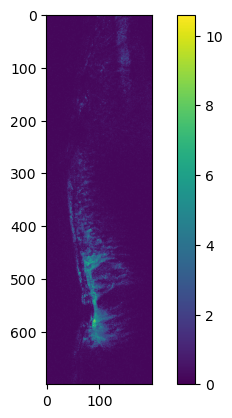

2.3560230897766976 0.01201319518318237


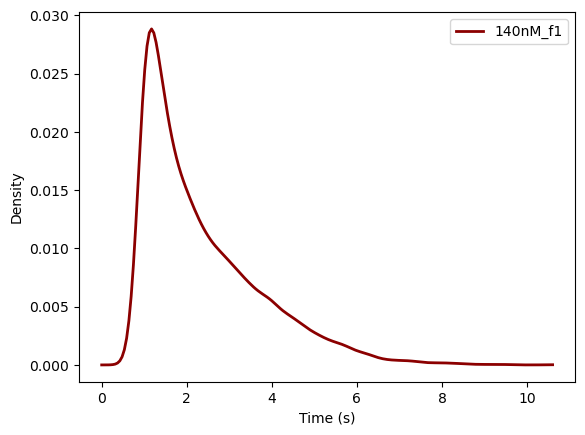

In [365]:
Z2 = np.median(T_1[2:5], axis = 0)
x = np.linspace(0, np.shape(Z)[1], np.shape(Z)[1])
y = np.linspace(0, np.shape(Z)[0], np.shape(Z)[0])

X, Y = np.meshgrid(x, y)


hex_color = "#09b795"

# Create a gradient colormap: from white to your color
cmap = LinearSegmentedColormap.from_list("my_cmap", ["#ffffff", hex_color])
plt.imshow(Z2, cmap =cmap)

plt.contourf(X, Y, Z2, levels = 7, cmap=cmap, vmax = np.max(Z2))
plt.colorbar(label = 'Time(s)')
    
#plt.savefig("sideWaveAllFish_median.svg")
plt.show()

data_opsin = Z2[0:700, 500:700]

plt.imshow(data_opsin)
plt.colorbar()
plt.show()

kde_bottom = gaussian_kde(data_opsin[data_opsin>max_noise])
x_vals_bottom = np.linspace(0, np.max(data_opsin), 200)
kde_vals_bottom = kde_bottom(x_vals_bottom)/np.sum(kde_bottom(x_vals_bottom))

print(np.mean(data_opsin[data_opsin>max_noise]), sem(data_opsin[data_opsin>max_noise]))

# Plot smooth KDE curve
plt.plot(x_vals_bottom, kde_vals_bottom, color="darkred", linewidth=2, label="140nM_f1")

plt.legend()
plt.xlabel("Time (s)")
plt.ylabel("Density")
#plt.xlim(0, 0.6)
#plt.yscale('log')
plt.savefig("140nM_hist_f1.svg")


### Fish 4

In [367]:
names[5:8]

array(['F4_140nM_t1 - 1.tif', 'F4_140nM_t2.tif', 'F4_140nM_t3.tif'],
      dtype='<U19')

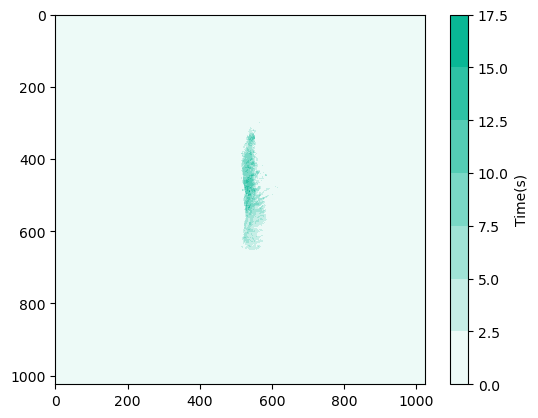

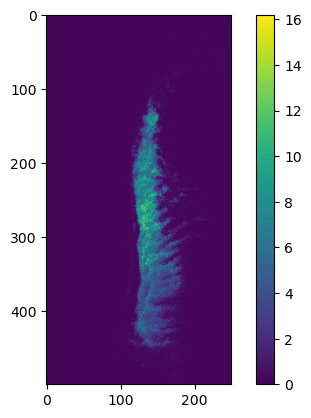

4.526549690780958 0.022071665357816718


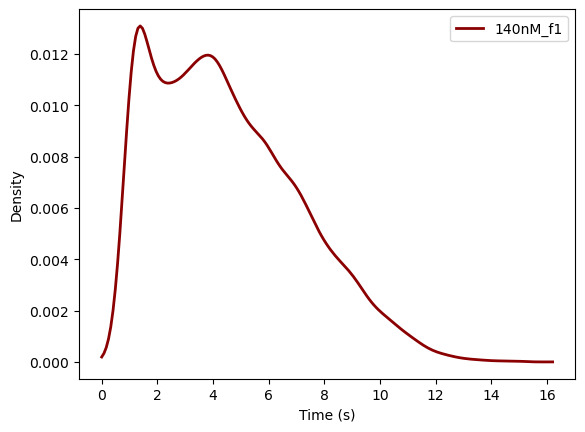

In [369]:
Z3 = np.median(T_1[5:8], axis = 0)
x = np.linspace(0, np.shape(Z)[1], np.shape(Z)[1])
y = np.linspace(0, np.shape(Z)[0], np.shape(Z)[0])

X, Y = np.meshgrid(x, y)


hex_color = "#09b795"

# Create a gradient colormap: from white to your color
cmap = LinearSegmentedColormap.from_list("my_cmap", ["#ffffff", hex_color])
plt.imshow(Z3, cmap =cmap)

plt.contourf(X, Y, Z3, levels = 7, cmap=cmap, vmax = np.max(Z3))
plt.colorbar(label = 'Time(s)')
    
#plt.savefig("sideWaveAllFish_median.svg")
plt.show()

data_opsin = Z3[200:700, 400:650]

plt.imshow(data_opsin)
plt.colorbar()
plt.show()

kde_bottom = gaussian_kde(data_opsin[data_opsin>max_noise])
x_vals_bottom = np.linspace(0, np.max(data_opsin), 200)
kde_vals_bottom = kde_bottom(x_vals_bottom)/np.sum(kde_bottom(x_vals_bottom))

print(np.mean(data_opsin[data_opsin>max_noise]), sem(data_opsin[data_opsin>max_noise]))

# Plot smooth KDE curve
plt.plot(x_vals_bottom, kde_vals_bottom, color="darkred", linewidth=2, label="140nM_f1")

plt.legend()
plt.xlabel("Time (s)")
plt.ylabel("Density")
#plt.xlim(0, 0.6)
#plt.yscale('log')
plt.savefig("140nM_hist_f1.svg")


### Fish 5

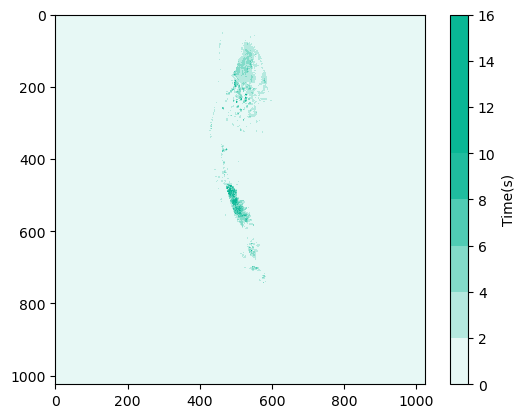

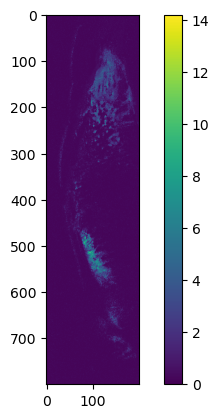

2.529106628242075 0.013939887307037121


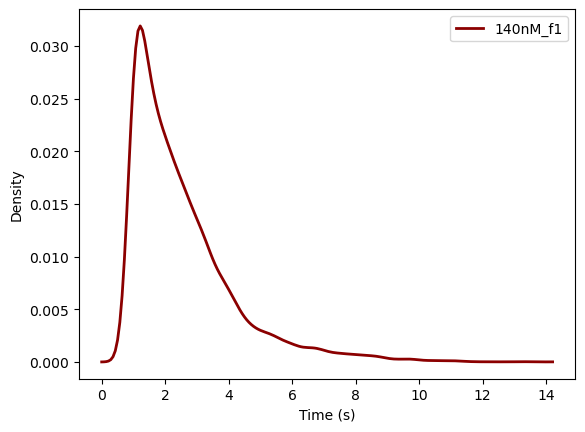

In [371]:
Z4 = T_1[8]
x = np.linspace(0, np.shape(Z)[1], np.shape(Z)[1])
y = np.linspace(0, np.shape(Z)[0], np.shape(Z)[0])

X, Y = np.meshgrid(x, y)


hex_color = "#09b795"

# Create a gradient colormap: from white to your color
cmap = LinearSegmentedColormap.from_list("my_cmap", ["#ffffff", hex_color])
plt.imshow(Z4, cmap =cmap)

plt.contourf(X, Y, Z4, levels = 7, cmap=cmap, vmax = np.max(Z1))
plt.colorbar(label = 'Time(s)')
    
#plt.savefig("sideWaveAllFish_median.svg")
plt.show()

data_opsin = Z4[0:800, 400:600]

plt.imshow(data_opsin)
plt.colorbar()
plt.show()

kde_bottom = gaussian_kde(data_opsin[data_opsin>max_noise])
x_vals_bottom = np.linspace(0, np.max(data_opsin), 200)
kde_vals_bottom = kde_bottom(x_vals_bottom)/np.sum(kde_bottom(x_vals_bottom))

print(np.mean(data_opsin[data_opsin>max_noise]), sem(data_opsin[data_opsin>max_noise]))

# Plot smooth KDE curve
plt.plot(x_vals_bottom, kde_vals_bottom, color="darkred", linewidth=2, label="140nM_f1")

plt.legend()
plt.xlabel("Time (s)")
plt.ylabel("Density")
#plt.xlim(0, 0.6)
#plt.yscale('log')
plt.savefig("140nM_hist_f1.svg")


3.4194179278230505 0.006685840417431022


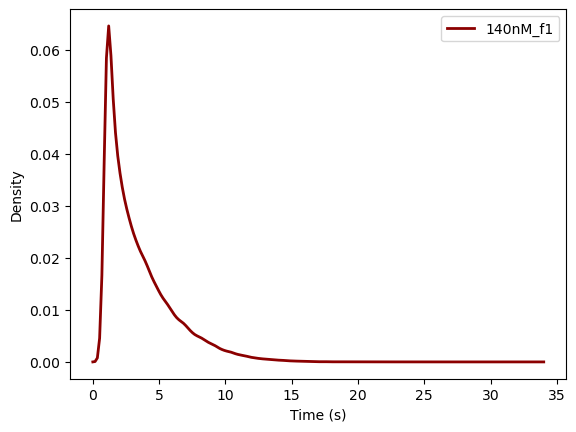

In [375]:
#z = np.array([Z1, Z2, Z3, Z4])
z = T_1.flatten()
z = z[z>max_noise]

kde_bottom = gaussian_kde(z)
x_vals_bottom = np.linspace(0, np.max(z), 200)
kde_vals_bottom = kde_bottom(x_vals_bottom)/np.sum(kde_bottom(x_vals_bottom))

print(np.mean(z[z>max_noise]), sem(z[z>max_noise]))

# Plot smooth KDE curve
plt.plot(x_vals_bottom, kde_vals_bottom, color="darkred", linewidth=2, label="140nM_f1")

plt.legend()
plt.xlabel("Time (s)")
plt.ylabel("Density")
#plt.xlim(0, 0.6)
#plt.yscale('log')
plt.savefig("140nM_hist_4fish.svg")



### Alignment

100
100
0
100
30
198
62
199


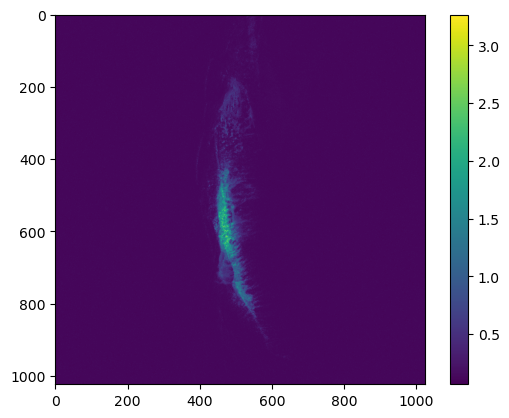

In [377]:
#Align maps by fish
Z = np.array([Z1, Z2, Z3, Z4])
final = Z1

maxima_x = []
maxima_y = []

for i in range(4):
    c_x = []
    c_y = []
    
    for j in range(-100, 100):
        
        c_x.append(np.corrcoef(final.flatten(), np.roll(Z[i,:,:], j, axis=1).flatten())[0,1])
        
    c_x = np.array(c_x)
    max_x = np.argmax(c_x)
    print(max_x)
    maxima_x.append(max_x)
    
    Z[i] = np.roll(Z[i], max_x-100, axis=1)

    for j in range(-100, 100):
        c_y.append(np.corrcoef(final.flatten(), np.roll(T_1[i,:,:], j, axis=0).flatten())[0,1])
        
    c_y = np.array(c_y)
    max_y = np.argmax(c_y)
    print(max_y)
    maxima_y.append(max_y)
    
    Z[i] = np.roll(Z[i], max_y-100, axis=0)

    final =final + Z[i]

plt.imshow(final/len(T_1))
plt.colorbar()


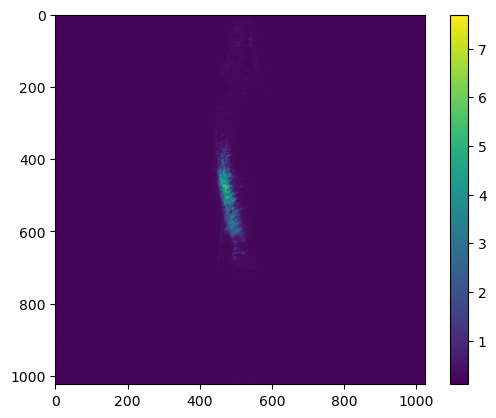

In [379]:
plt.imshow(Z_140)
plt.colorbar()

### Final Map + histogram

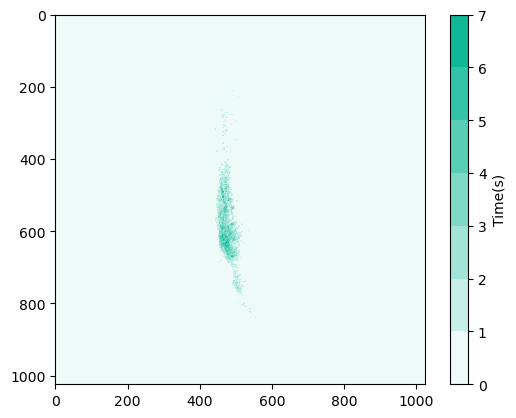

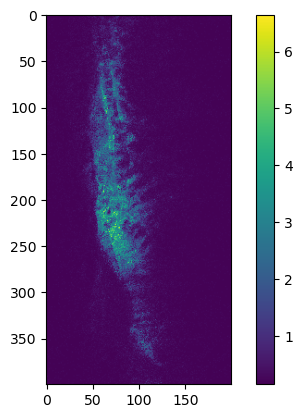

2.0035866159355415 0.010065471668524737


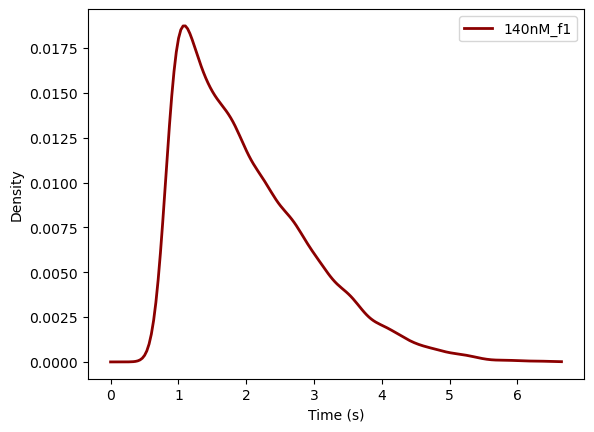

In [392]:
Z_140 = np.median(Z, axis=0)
x = np.linspace(0, np.shape(Z_140)[1], np.shape(Z_140)[1])
y = np.linspace(0, np.shape(Z_140)[0], np.shape(Z_140)[0])

X, Y = np.meshgrid(x, y)

plt.imshow(Z_140, cmap =cmap)

plt.contourf(X, Y, Z_140, levels = 7, cmap=cmap, vmax = np.max(Z_140))
plt.colorbar(label = 'Time(s)')
    
plt.savefig("sideWave_median_140nM.svg")
plt.show()

data_opsin = Z_140[400:800, 400:600]

plt.imshow(data_opsin)
plt.colorbar()
plt.show()

kde_bottom = gaussian_kde(data_opsin[data_opsin>max_noise])
x_vals_bottom = np.linspace(0, np.max(data_opsin), 200)
kde_vals_bottom = kde_bottom(x_vals_bottom)/np.sum(kde_bottom(x_vals_bottom))

print(np.mean(data_opsin[data_opsin>max_noise]), sem(data_opsin[data_opsin>max_noise]))

# Plot smooth KDE curve
plt.plot(x_vals_bottom, kde_vals_bottom, color="darkred", linewidth=2, label="140nM_f1")

plt.legend()
plt.xlabel("Time (s)")
plt.ylabel("Density")
#plt.xlim(0, 0.6)
#plt.yscale('log')
plt.savefig("140nM_hist.svg")


## 35 nM

F1_35nM_t1.tif (600, 1024, 1024)
F1_35nM_t2.tif (600, 1024, 1024)
F1_35nM_t3.tif (600, 1024, 1024)
F2_35nM_t1.tif (600, 1024, 1024)
F2_35nM_t2.tif (600, 1024, 1024)
F2_35nM_t3.tif (600, 1024, 1024)
F3_35nM_t1.tif (600, 1024, 1024)
F3_35nM_t2.tif (590, 1024, 1024)
F3_35nM_t3.tif (600, 1024, 1024)
F4_35nM_t1.tif (600, 1024, 1024)
F4_35nM_t2.tif (600, 1024, 1024)
F4_35nM_t3.tif (600, 1024, 1024)


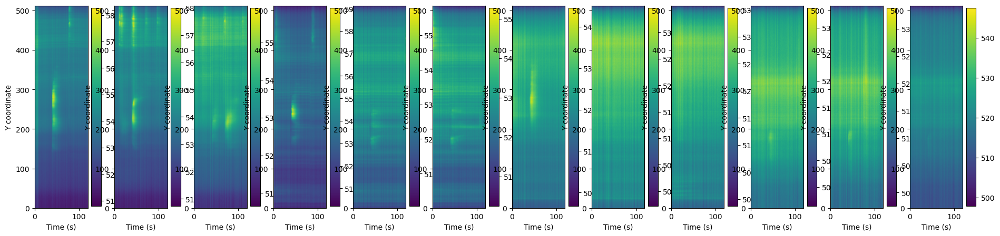

In [394]:
#Input and visualization of the data (x-averaged plots)

path = "35nM"
waves = np.sort(os.listdir(path))[1:]
len(waves)

WAVES = []
TIMES = []

plt.figure(figsize = (25, 5))
i=1

for filename in np.sort(os.listdir(path))[1:-1]:

    wave = imread(path + '/' + filename)

    #wave = (wave - np.mean(wave[0:800, :, :]))/np.mean(wave[0:800, :, :])

    times = np.linspace(0,len(wave[:,0,0])*0.2,len(wave[:,0,0])+1)
    times = times[:-1]
    TIMES.append(times)
    
    print(filename, np.shape(wave)) 
    plt.subplot(1, len(waves), i)
    i = i+1
    plt.imshow(np.mean(wave, axis=2).T, aspect='auto', extent=[0, np.max(times), 0, 512])
    plt.colorbar()
    plt.xlabel("Time (s)")
    plt.ylabel("Y coordinate")
    WAVES.append(wave)

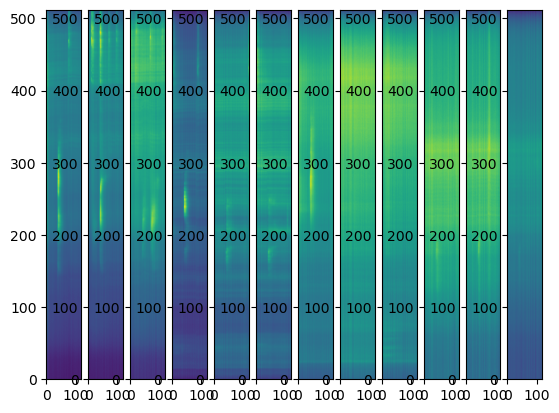

In [395]:
#Remove saturated frames
saturated_threshold = 255

# Process each TIFF file
for w in range(0, len(WAVES)):

    # Calculate the mean image
    mean_image = np.mean(WAVES[w][9:11,:,:], axis=0)

    for i in range(0, len(WAVES[w])):
        
        frame = WAVES[w][i,100:200,100:200]
        
        if np.all(frame == frame[0]):
            #print(w, ' -> ',i)
            WAVES[w][i,:,:] = mean_image

    plt.subplot(1, len(WAVES), w+1)
    plt.imshow(np.mean(WAVES[w], axis=2).T, aspect='auto', extent=[0, np.max(times), 0, 512])


/var/folders/1w/c82l1gs16tbfqhkg5hbpwkp00000gp/T/ipykernel_90661/3570604281.py:20: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  tau1[i,j] = half_max_time_r[0] + half_max_time_l[0]


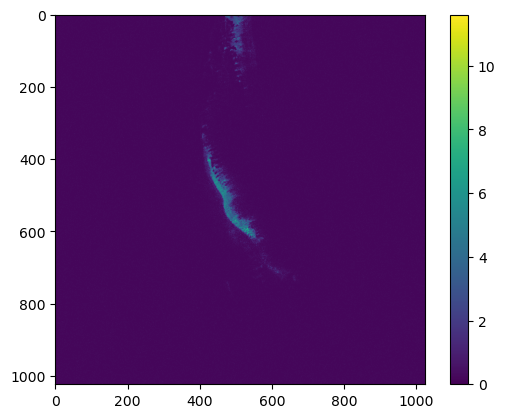

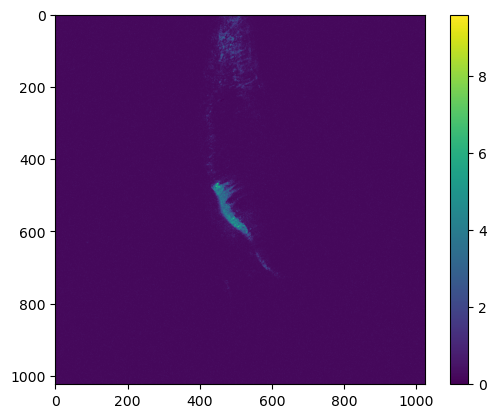

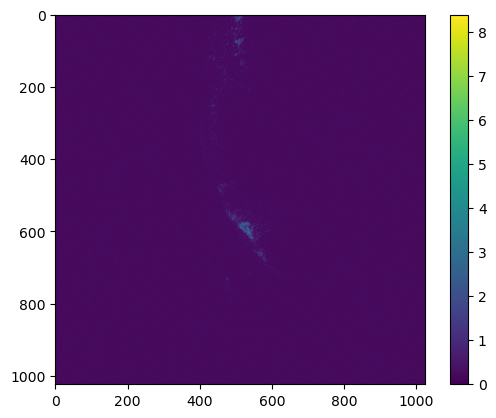

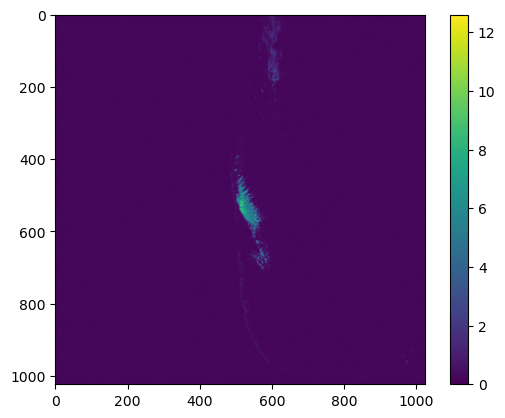

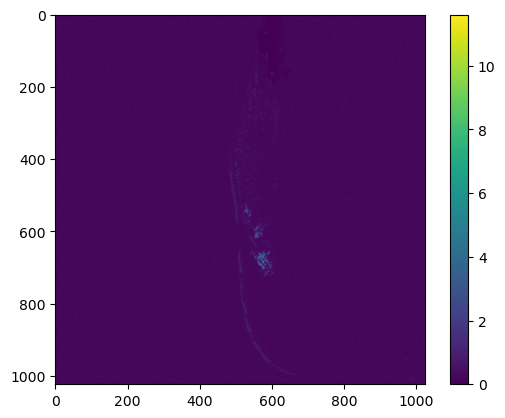

...

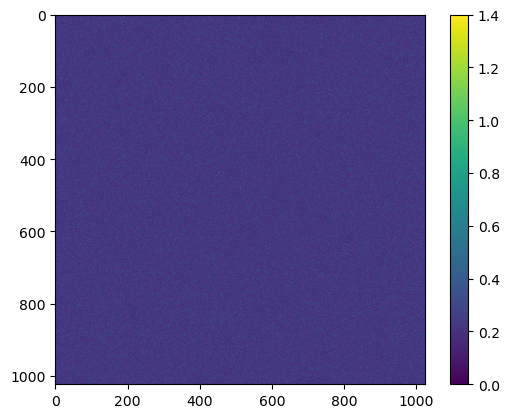

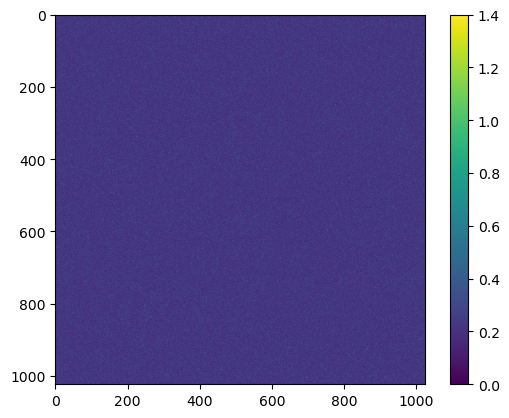

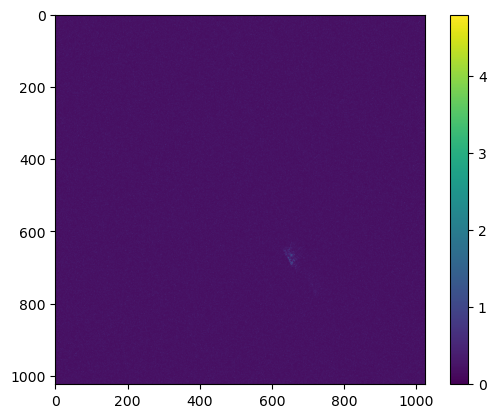

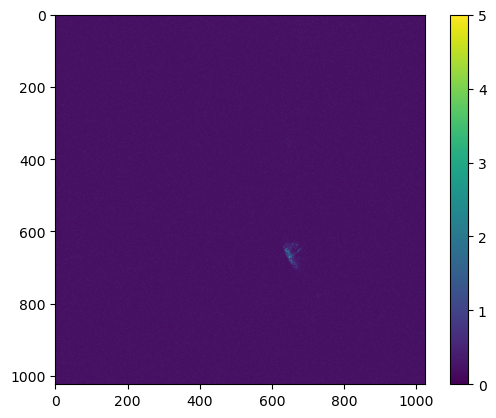

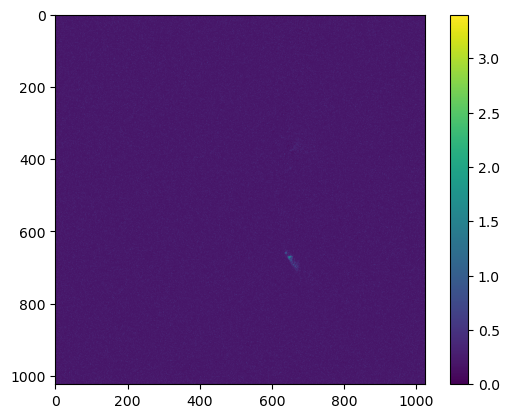

In [396]:
time_maps = []

for w in range(0, len(WAVES)):
    
    tau1 = np.zeros(np.shape(WAVES[w][0, :, :]))
    m1 = np.nanmean(WAVES[w][0:150, :,:], axis = 0)
    #m1 = np.mean(m1)

    for i in range(0, len(WAVES[w][0, :, 0])):
        for j in range(0, len(WAVES[w][0, 0, :])):
                   
            y1 = WAVES[w][150:, i, j] - m1[i,j]
            max_time1 = np.argmax(y1)

            half_max_time_r = np.argwhere(y1[max_time1:] < y1[max_time1]/2)
            half_max_time_l = np.argwhere(y1[:max_time1] < y1[max_time1]/2)

         #Sum the two values to get width at half max
            if(len(half_max_time_r) > 0 and len(half_max_time_l) > 0):
                tau1[i,j] = half_max_time_r[0] + half_max_time_l[0]
            else:
                tau1[i,j] = 0

    tau1[tau1<0] = 0
    tau1[tau1>500] = 0
    tau1 = tau1*0.2

    plt.imshow(tau1)
    plt.colorbar()
    plt.show()

    time_maps.append(tau1)


In [406]:
max_noise = .8

In [408]:
T_1 = np.array(time_maps)
names = np.sort(os.listdir(path))[1:-1]
print(names[:3])

['F1_35nM_t1.tif' 'F1_35nM_t2.tif' 'F1_35nM_t3.tif']


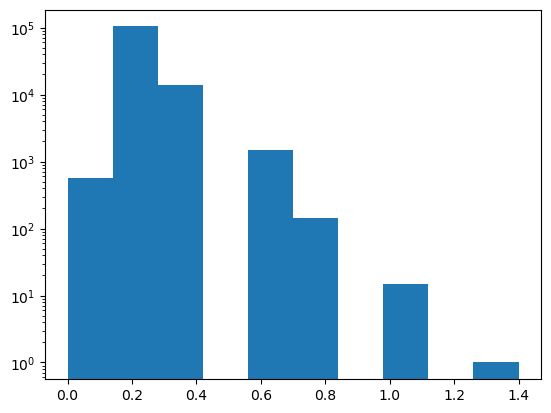

In [410]:
plt.hist(T_1[:, :100,:100].flatten() )
plt.yscale('log')
plt.show()

### Fish 1

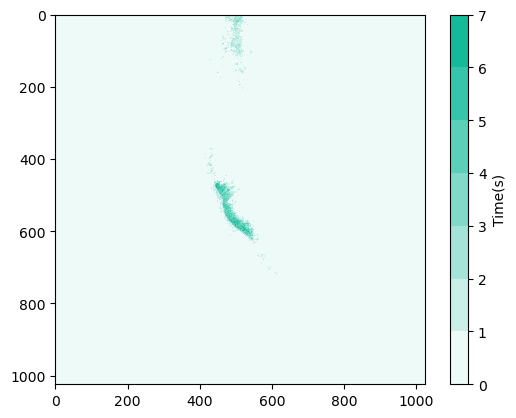

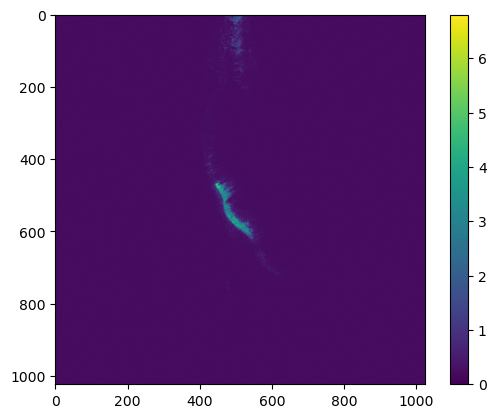

2.2882333443818363 0.015471453034220537


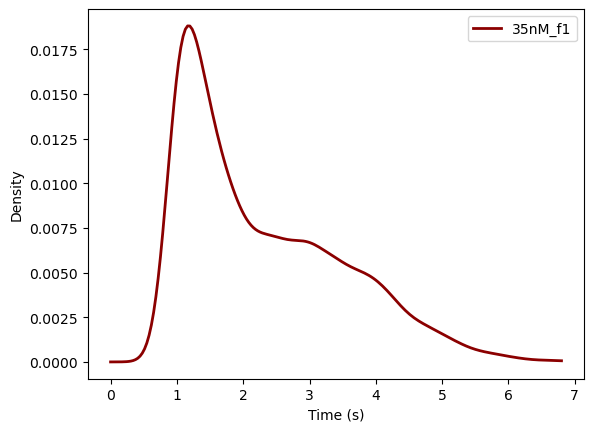

In [415]:
Z1 = np.median(T_1[:3], axis=0)
x = np.linspace(0, np.shape(Z1)[1], np.shape(Z1)[1])
y = np.linspace(0, np.shape(Z1)[0], np.shape(Z1)[0])

X, Y = np.meshgrid(x, y)

plt.imshow(Z1, cmap =cmap)

plt.contourf(X, Y, Z1, levels = 7, cmap=cmap, vmax = np.max(Z1))
plt.colorbar(label = 'Time(s)')
    
#plt.savefig("sideWaveAllFish_median.svg")
plt.show()

data_opsin = Z1

plt.imshow(data_opsin)
plt.colorbar()
plt.show()

kde_bottom = gaussian_kde(data_opsin[data_opsin>max_noise])
x_vals_bottom = np.linspace(0, np.max(data_opsin), 200)
kde_vals_bottom = kde_bottom(x_vals_bottom)/np.sum(kde_bottom(x_vals_bottom))

print(np.mean(data_opsin[data_opsin>max_noise]), sem(data_opsin[data_opsin>max_noise]))

# Plot smooth KDE curve
plt.plot(x_vals_bottom, kde_vals_bottom, color="darkred", linewidth=2, label="35nM_f1")

plt.legend()
plt.xlabel("Time (s)")
plt.ylabel("Density")
#plt.xlim(0, 0.6)
#plt.yscale('log')
plt.savefig("35nM_hist_f1.svg")


### Fish 2

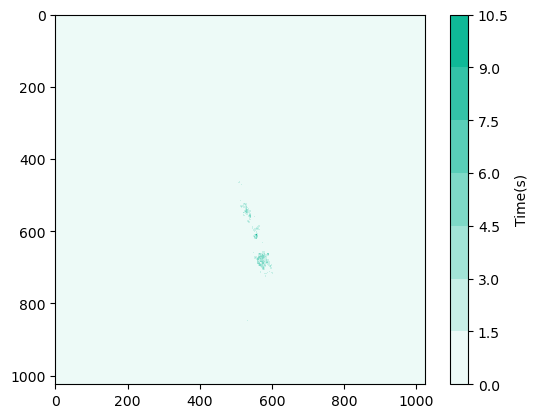

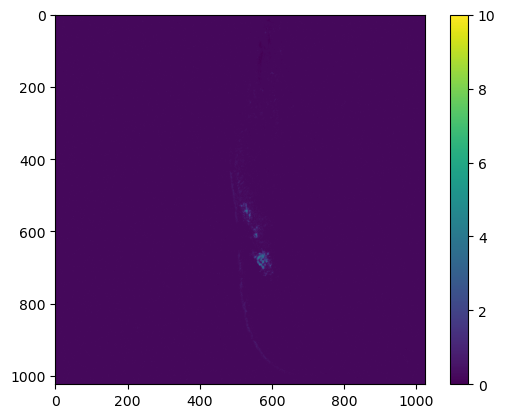

1.9629239766081872 0.02648502354748822


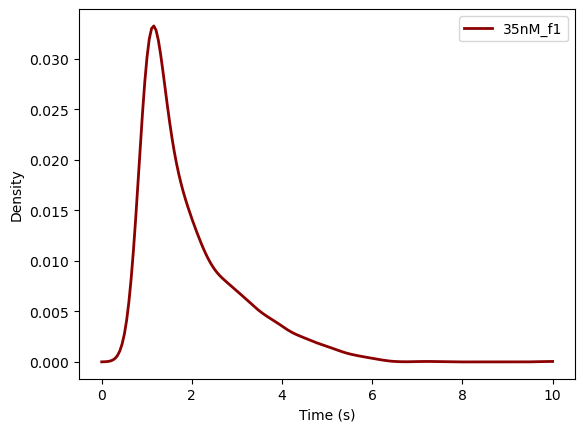

In [417]:
Z2 = np.median(T_1[3:6], axis=0)

# Create a gradient colormap: from white to your color
cmap = LinearSegmentedColormap.from_list("my_cmap", ["#ffffff", hex_color])
plt.imshow(Z2, cmap =cmap)

plt.contourf(X, Y, Z2, levels = 7, cmap=cmap, vmax = np.max(Z2))
plt.colorbar(label = 'Time(s)')
    
#plt.savefig("sideWaveAllFish_median.svg")
plt.show()

data_opsin = Z2

plt.imshow(data_opsin)
plt.colorbar()
plt.show()

kde_bottom = gaussian_kde(data_opsin[data_opsin>max_noise])
x_vals_bottom = np.linspace(0, np.max(data_opsin), 200)
kde_vals_bottom = kde_bottom(x_vals_bottom)/np.sum(kde_bottom(x_vals_bottom))

print(np.mean(data_opsin[data_opsin>max_noise]), sem(data_opsin[data_opsin>max_noise]))

# Plot smooth KDE curve
plt.plot(x_vals_bottom, kde_vals_bottom, color="darkred", linewidth=2, label="35nM_f1")

plt.legend()
plt.xlabel("Time (s)")
plt.ylabel("Density")
#plt.xlim(0, 0.6)
#plt.yscale('log')
plt.savefig("35nM_hist_f1.svg")


### Fish 3

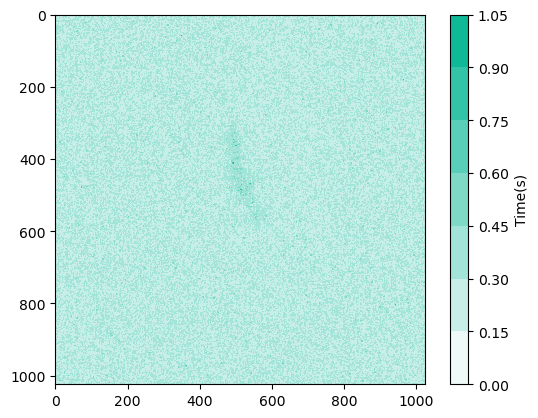

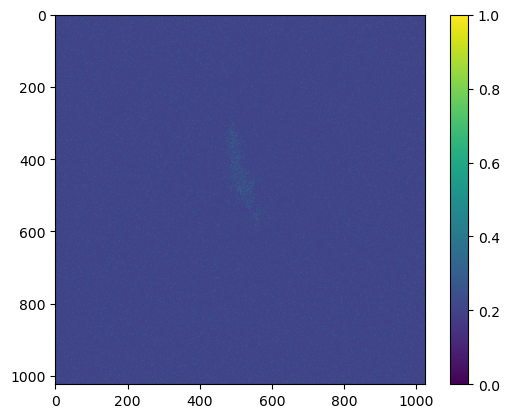

ValueError: `dataset` input should have multiple elements.

In [425]:
Z3 = np.median(T_1[6:9], axis = 0)

plt.imshow(Z3, cmap =cmap)

plt.contourf(X, Y, Z3, levels = 7, cmap=cmap, vmax = np.max(Z3))
plt.colorbar(label = 'Time(s)')
    
#plt.savefig("sideWaveAllFish_median.svg")
plt.show()

data_opsin = Z3

plt.imshow(data_opsin)
plt.colorbar()
plt.show()

kde_bottom = gaussian_kde(data_opsin[data_opsin>max_noise])
x_vals_bottom = np.linspace(0, np.max(data_opsin), 200)
kde_vals_bottom = kde_bottom(x_vals_bottom)/np.sum(kde_bottom(x_vals_bottom))

print(np.mean(data_opsin[data_opsin>max_noise]), sem(data_opsin[data_opsin>max_noise]))

# Plot smooth KDE curve
plt.plot(x_vals_bottom, kde_vals_bottom, color="darkred", linewidth=2, label="35nM_f1")

plt.legend()
plt.xlabel("Time (s)")
plt.ylabel("Density")
#plt.xlim(0, 0.6)
#plt.yscale('log')
plt.savefig("35nM_hist_f1.svg")


1.0

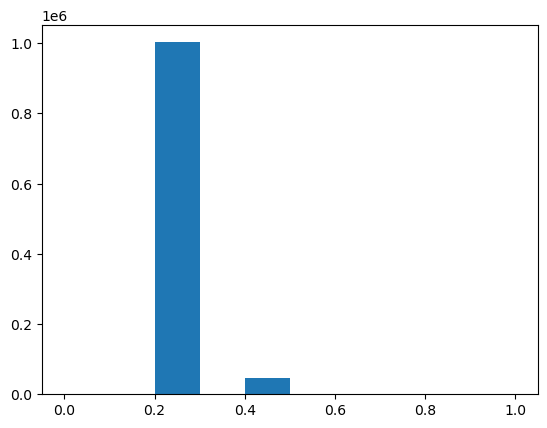

In [421]:
plt.hist(data_opsin.flatten())
data_opsin.max()

### Fish 4

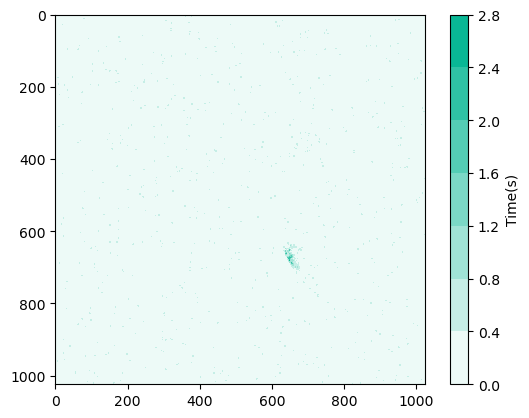

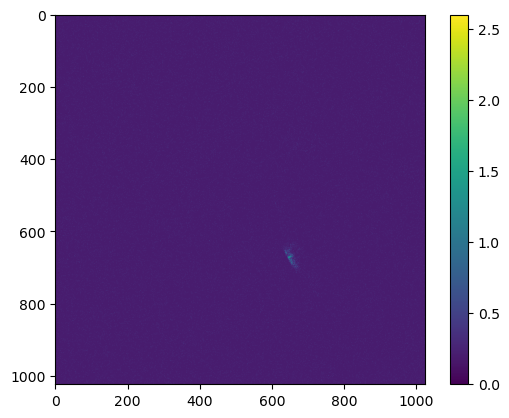

1.3154639175257732 0.0378588275154592


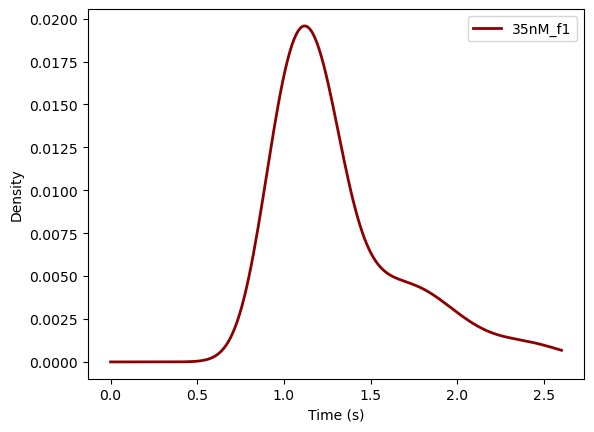

In [427]:
Z4 = np.median(T_1[9:], axis=0)

plt.imshow(Z4, cmap =cmap)

plt.contourf(X, Y, Z4, levels = 7, cmap=cmap, vmax = np.max(Z4))
plt.colorbar(label = 'Time(s)')
    
#plt.savefig("sideWaveAllFish_median.svg")
plt.show()

data_opsin = Z4

plt.imshow(data_opsin)
plt.colorbar()
plt.show()

kde_bottom = gaussian_kde(data_opsin[data_opsin>max_noise])
x_vals_bottom = np.linspace(0, np.max(data_opsin), 200)
kde_vals_bottom = kde_bottom(x_vals_bottom)/np.sum(kde_bottom(x_vals_bottom))

print(np.mean(data_opsin[data_opsin>max_noise]), sem(data_opsin[data_opsin>max_noise]))

# Plot smooth KDE curve
plt.plot(x_vals_bottom, kde_vals_bottom, color="darkred", linewidth=2, label="35nM_f1")

plt.legend()
plt.xlabel("Time (s)")
plt.ylabel("Density")
#plt.xlim(0, 0.6)
#plt.yscale('log')
plt.savefig("35nM_hist_f1.svg")


### Alignment

100
100
52
100
34
100
29
160


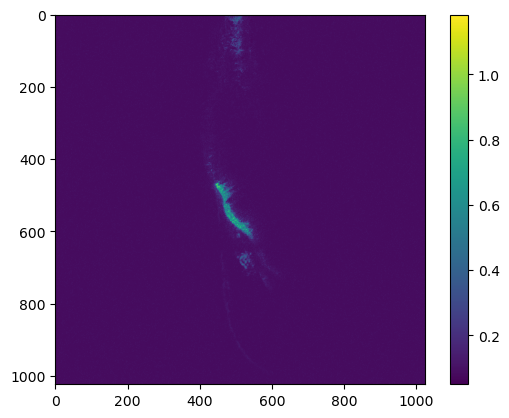

In [429]:
#Align maps by fish
Z = np.array([Z1, Z2, Z3, Z4])
final = Z1

maxima_x = []
maxima_y = []

for i in range(4):
    c_x = []
    c_y = []
    
    for j in range(-100, 100):
        
        c_x.append(np.corrcoef(final.flatten(), np.roll(Z[i,:,:], j, axis=1).flatten())[0,1])
        
    c_x = np.array(c_x)
    max_x = np.argmax(c_x)
    print(max_x)
    maxima_x.append(max_x)
    
    Z[i] = np.roll(Z[i], max_x-100, axis=1)

    for j in range(-100, 100):
        c_y.append(np.corrcoef(final.flatten(), np.roll(T_1[i,:,:], j, axis=0).flatten())[0,1])
        
    c_y = np.array(c_y)
    max_y = np.argmax(c_y)
    print(max_y)
    maxima_y.append(max_y)
    
    Z[i] = np.roll(Z[i], max_y-100, axis=0)

    final =final + Z[i]

plt.imshow(final/len(T_1))
plt.colorbar()


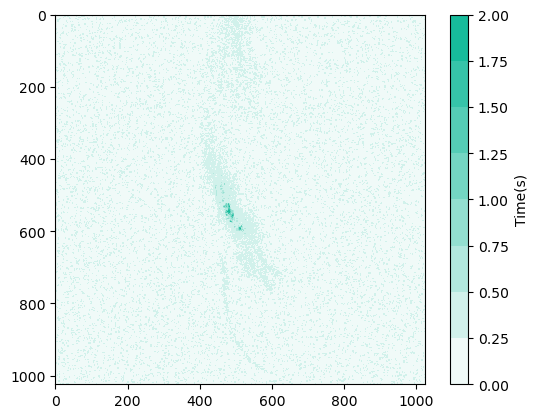

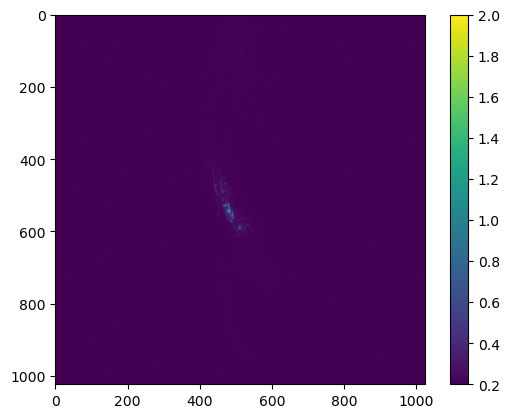

1.1906040268456377 0.023275693745912783


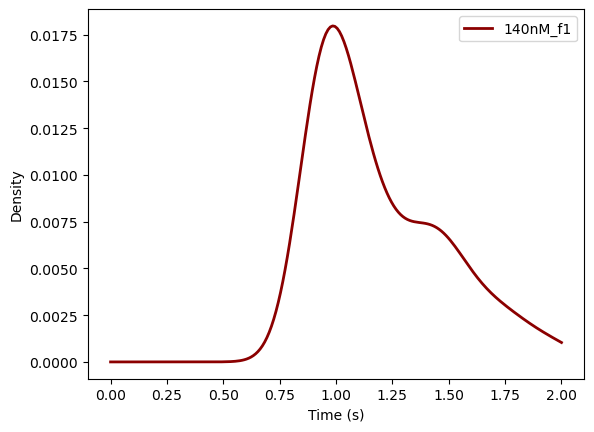

In [435]:
Z_35 = np.median(Z, axis=0)

plt.imshow(Z_35, cmap =cmap)

plt.contourf(X, Y, Z_35, levels = 7, cmap=cmap, vmax = np.max(Z_35))
plt.colorbar(label = 'Time(s)')
    
plt.savefig("sideWave_median_35nM.svg")
plt.show()

data_opsin = Z_35

plt.imshow(data_opsin)
plt.colorbar()
plt.show()

kde_bottom = gaussian_kde(data_opsin[data_opsin>max_noise])
x_vals_bottom = np.linspace(0, np.max(data_opsin), 200)
kde_vals_bottom = kde_bottom(x_vals_bottom)/np.sum(kde_bottom(x_vals_bottom))

print(np.mean(data_opsin[data_opsin>max_noise]), sem(data_opsin[data_opsin>max_noise]))

# Plot smooth KDE curve
plt.plot(x_vals_bottom, kde_vals_bottom, color="darkred", linewidth=2, label="140nM_f1")

plt.legend()
plt.xlabel("Time (s)")
plt.ylabel("Density")
#plt.xlim(0, 0.6)
#plt.yscale('log')
plt.savefig("35nM_hist.svg")


## 7 nM

F1_7nM_t1.tif (300, 1024, 1024)
F1_7nM_t2.tif (300, 1024, 1024)
F1_7nM_t3.tif (300, 1024, 1024)
F2_7nM_t1.tif (300, 1024, 1024)
F2_7nM_t2.tif (300, 1024, 1024)
F2_7nM_t3.tif (300, 1024, 1024)
F3_7nM_t1.tif (300, 1024, 1024)
F3_7nM_t2.tif (300, 1024, 1024)
F3_7nM_t3.tif (300, 1024, 1024)
F4_7nM_t1.tif (300, 1024, 1024)
F4_7nM_t2.tif (300, 1024, 1024)
F4_7nM_t3.tif (300, 1024, 1024)


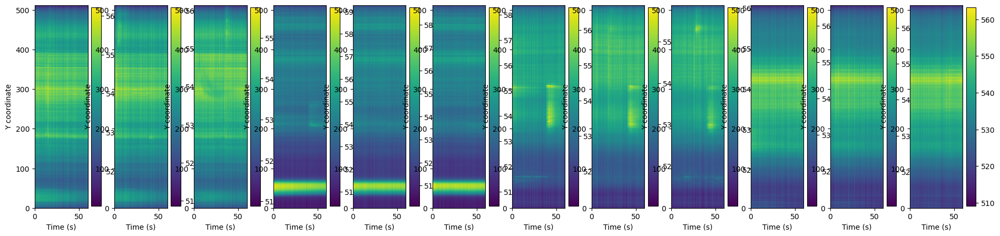

In [437]:
#Input and visualization of the data (x-averaged plots)

path = "7nM"
waves = np.sort(os.listdir(path))[1:]
len(waves)

WAVES = []
TIMES = []

plt.figure(figsize = (25, 5))
i=1

for filename in np.sort(os.listdir(path))[1:-1]:

    wave = imread(path + '/' + filename)

    #wave = (wave - np.mean(wave[0:800, :, :]))/np.mean(wave[0:800, :, :])

    times = np.linspace(0,len(wave[:,0,0])*0.2,len(wave[:,0,0])+1)
    times = times[:-1]
    TIMES.append(times)
    
    print(filename, np.shape(wave)) 
    plt.subplot(1, len(waves), i)
    i = i+1
    plt.imshow(np.mean(wave, axis=2).T, aspect='auto', extent=[0, np.max(times), 0, 512])
    plt.colorbar()
    plt.xlabel("Time (s)")
    plt.ylabel("Y coordinate")
    WAVES.append(wave)

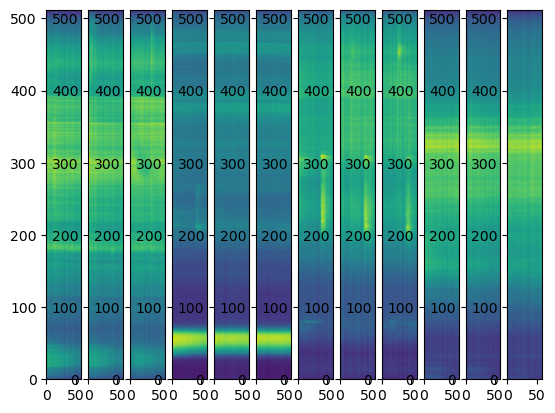

In [438]:
#Remove saturated frames
saturated_threshold = 255

# Process each TIFF file
for w in range(0, len(WAVES)):

    # Calculate the mean image
    mean_image = np.mean(WAVES[w][9:11,:,:], axis=0)

    for i in range(0, len(WAVES[w])):
        
        frame = WAVES[w][i,100:200,100:200]
        
        if np.all(frame == frame[0]):
            #print(w, ' -> ',i)
            WAVES[w][i,:,:] = mean_image

    plt.subplot(1, len(WAVES), w+1)
    plt.imshow(np.mean(WAVES[w], axis=2).T, aspect='auto', extent=[0, np.max(times), 0, 512])


/var/folders/1w/c82l1gs16tbfqhkg5hbpwkp00000gp/T/ipykernel_90661/3570604281.py:20: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  tau1[i,j] = half_max_time_r[0] + half_max_time_l[0]


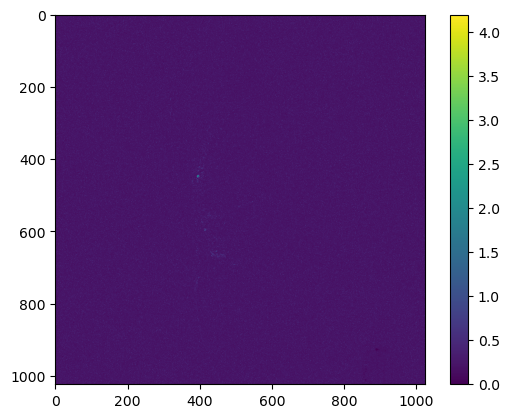

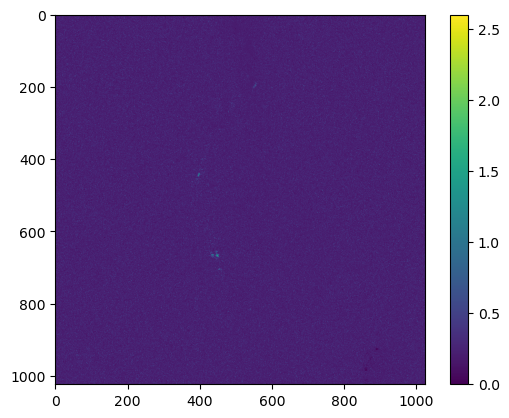

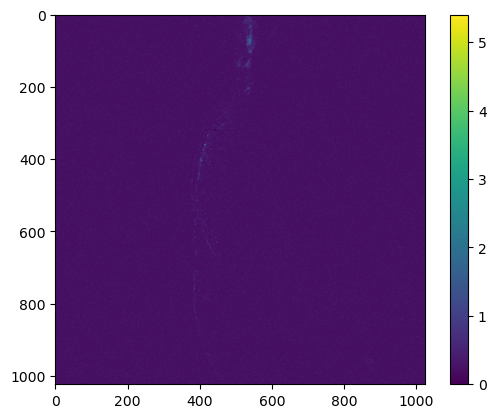

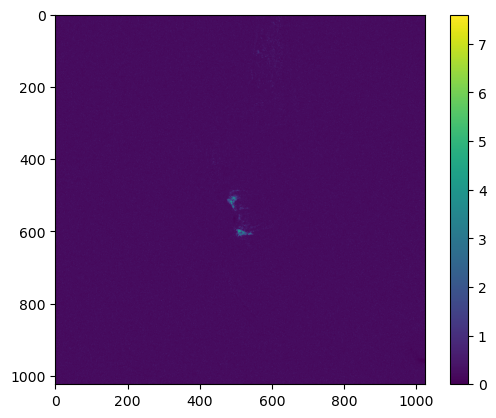

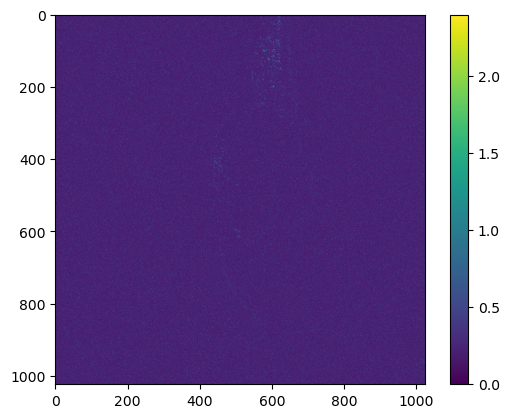

...

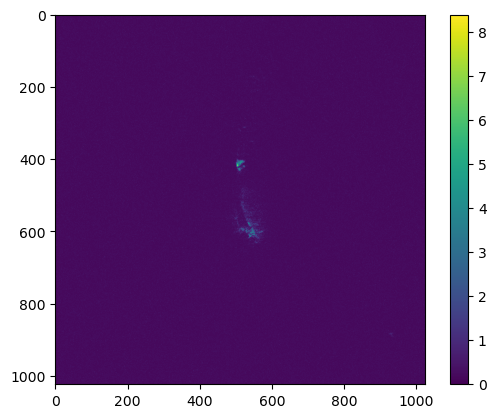

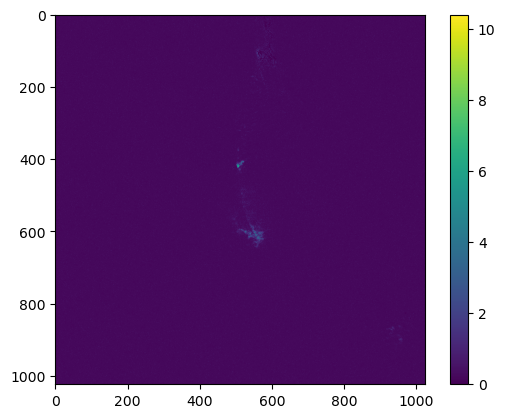

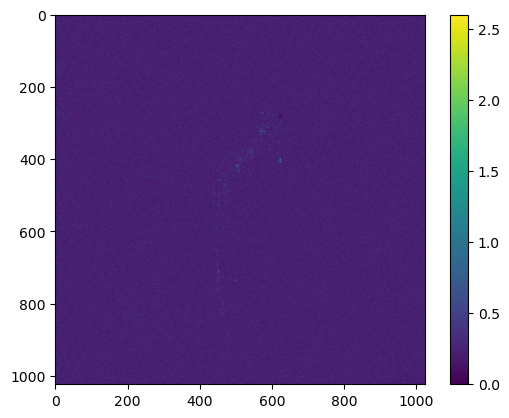

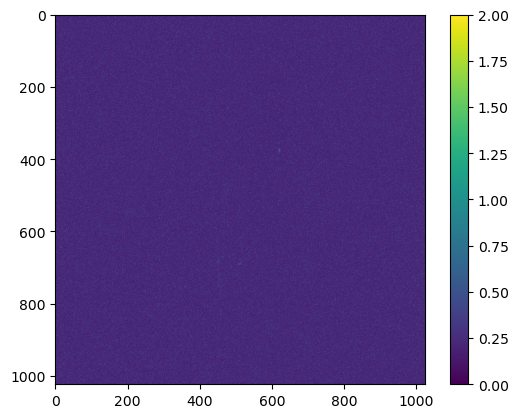

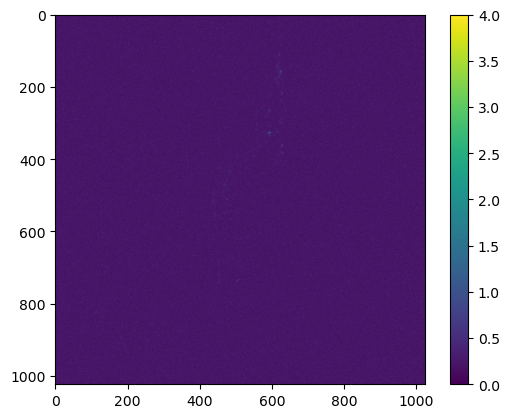

In [439]:
time_maps = []

for w in range(0, len(WAVES)):
    
    tau1 = np.zeros(np.shape(WAVES[w][0, :, :]))
    m1 = np.nanmean(WAVES[w][0:150, :,:], axis = 0)
    #m1 = np.mean(m1)

    for i in range(0, len(WAVES[w][0, :, 0])):
        for j in range(0, len(WAVES[w][0, 0, :])):
                   
            y1 = WAVES[w][150:, i, j] - m1[i,j]
            max_time1 = np.argmax(y1)

            half_max_time_r = np.argwhere(y1[max_time1:] < y1[max_time1]/2)
            half_max_time_l = np.argwhere(y1[:max_time1] < y1[max_time1]/2)

         #Sum the two values to get width at half max
            if(len(half_max_time_r) > 0 and len(half_max_time_l) > 0):
                tau1[i,j] = half_max_time_r[0] + half_max_time_l[0]
            else:
                tau1[i,j] = 0

    tau1[tau1<0] = 0
    tau1[tau1>500] = 0
    tau1 = tau1*0.2

    plt.imshow(tau1)
    plt.colorbar()
    plt.show()

    time_maps.append(tau1)


In [440]:
names = np.sort(os.listdir(path))[1:-1]
T_1 = np.array(time_maps)

### Fish 1

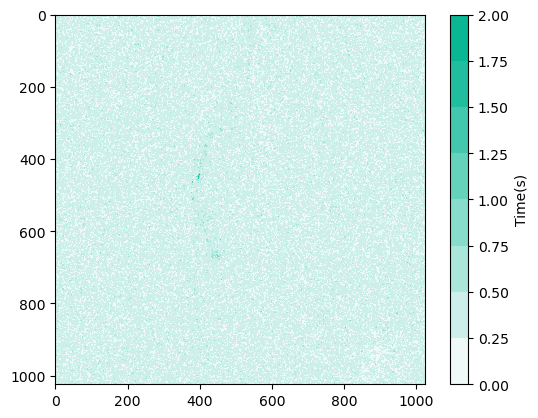

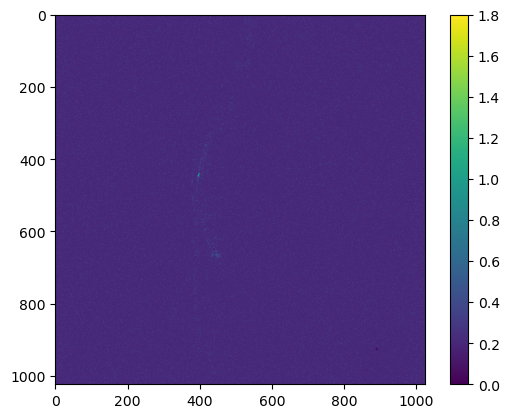

1.1692307692307693 0.043947251867956005


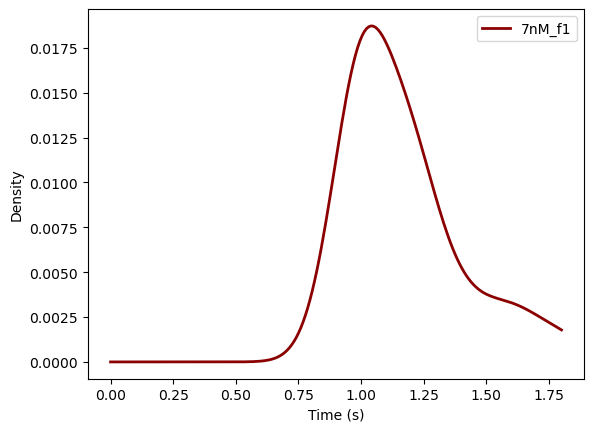

In [445]:
Z1 = np.median(T_1[:3], axis=0)
x = np.linspace(0, np.shape(Z1)[1], np.shape(Z1)[1])
y = np.linspace(0, np.shape(Z1)[0], np.shape(Z1)[0])

X, Y = np.meshgrid(x, y)

plt.imshow(Z1, cmap =cmap)

plt.contourf(X, Y, Z1, levels = 7, cmap=cmap, vmax = np.max(Z1))
plt.colorbar(label = 'Time(s)')
    
#plt.savefig("sideWaveAllFish_median.svg")
plt.show()

data_opsin = Z1

plt.imshow(data_opsin)
plt.colorbar()
plt.show()

kde_bottom = gaussian_kde(data_opsin[data_opsin>max_noise])
x_vals_bottom = np.linspace(0, np.max(data_opsin), 200)
kde_vals_bottom = kde_bottom(x_vals_bottom)/np.sum(kde_bottom(x_vals_bottom))

print(np.mean(data_opsin[data_opsin>max_noise]), sem(data_opsin[data_opsin>max_noise]))

# Plot smooth KDE curve
plt.plot(x_vals_bottom, kde_vals_bottom, color="darkred", linewidth=2, label="7nM_f1")

plt.legend()
plt.xlabel("Time (s)")
plt.ylabel("Density")
#plt.xlim(0, 0.6)
#plt.yscale('log')
plt.savefig("7nM_hist_f1.svg")


### Fish 2

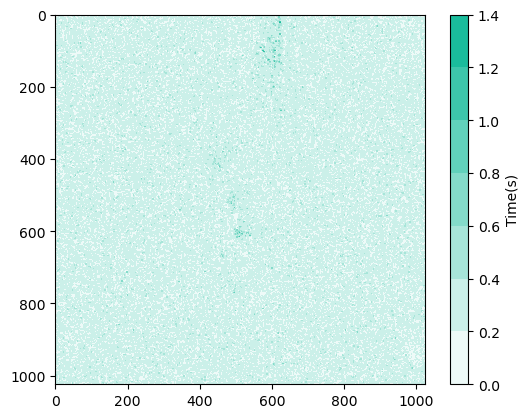

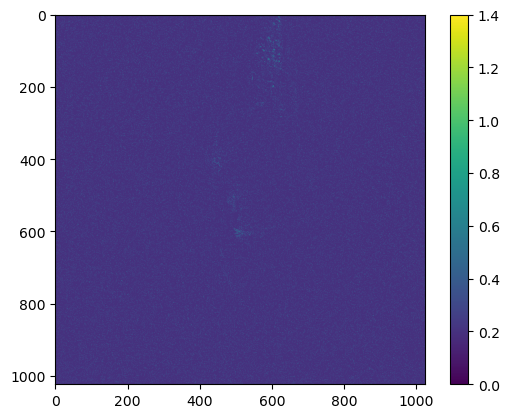

1.0962962962962963 0.022316986926001314


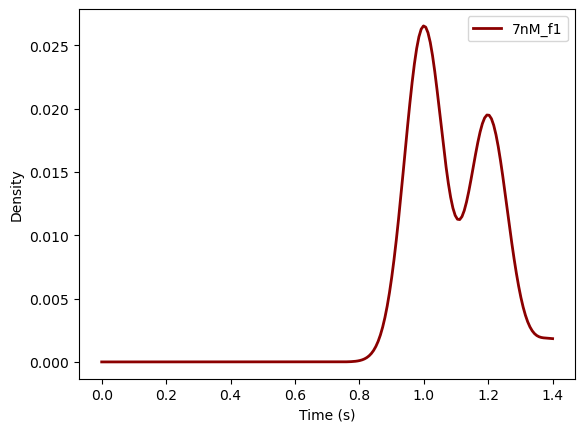

In [447]:
Z2 = np.median(T_1[3:6], axis=0)
x = np.linspace(0, np.shape(Z2)[1], np.shape(Z2)[1])
y = np.linspace(0, np.shape(Z2)[0], np.shape(Z2)[0])

X, Y = np.meshgrid(x, y)

hex_color = "#09b795"

# Create a gradient colormap: from white to your color
cmap = LinearSegmentedColormap.from_list("my_cmap", ["#ffffff", hex_color])
plt.imshow(Z2, cmap =cmap)

plt.contourf(X, Y, Z2, levels = 7, cmap=cmap, vmax = np.max(Z2))
plt.colorbar(label = 'Time(s)')
    
#plt.savefig("sideWaveAllFish_median.svg")
plt.show()

data_opsin = Z2

plt.imshow(data_opsin)
plt.colorbar()
plt.show()

kde_bottom = gaussian_kde(data_opsin[data_opsin>max_noise])
x_vals_bottom = np.linspace(0, np.max(data_opsin), 200)
kde_vals_bottom = kde_bottom(x_vals_bottom)/np.sum(kde_bottom(x_vals_bottom))

print(np.mean(data_opsin[data_opsin>max_noise]), sem(data_opsin[data_opsin>max_noise]))

# Plot smooth KDE curve
plt.plot(x_vals_bottom, kde_vals_bottom, color="darkred", linewidth=2, label="7nM_f1")

plt.legend()
plt.xlabel("Time (s)")
plt.ylabel("Density")
#plt.xlim(0, 0.6)
#plt.yscale('log')
plt.savefig("7nM_hist_f1.svg")


### Fish 3

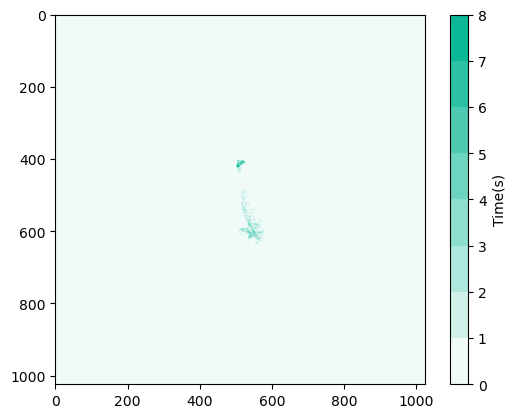

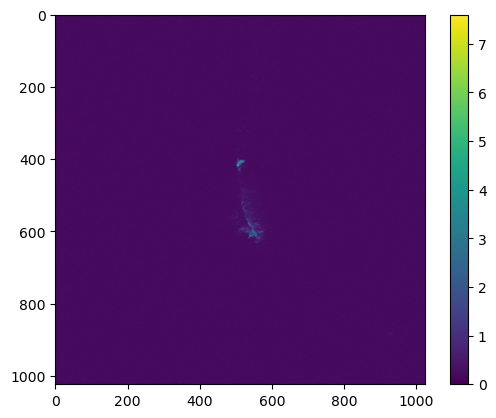

1.8248157248157248 0.024868004420824007


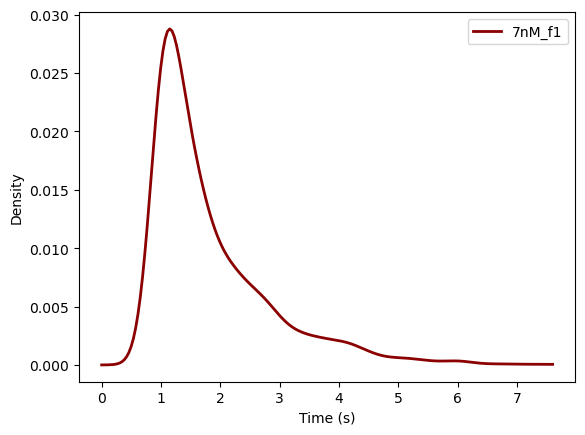

In [449]:
Z3 = np.median(T_1[6:9], axis = 0)

plt.imshow(Z3, cmap =cmap)

plt.contourf(X, Y, Z3, levels = 7, cmap=cmap, vmax = np.max(Z3))
plt.colorbar(label = 'Time(s)')
    
#plt.savefig("sideWaveAllFish_median.svg")
plt.show()

data_opsin = Z3

plt.imshow(data_opsin)
plt.colorbar()
plt.show()

kde_bottom = gaussian_kde(data_opsin[data_opsin>max_noise])
x_vals_bottom = np.linspace(0, np.max(data_opsin), 200)
kde_vals_bottom = kde_bottom(x_vals_bottom)/np.sum(kde_bottom(x_vals_bottom))

print(np.mean(data_opsin[data_opsin>max_noise]), sem(data_opsin[data_opsin>max_noise]))

# Plot smooth KDE curve
plt.plot(x_vals_bottom, kde_vals_bottom, color="darkred", linewidth=2, label="7nM_f1")

plt.legend()
plt.xlabel("Time (s)")
plt.ylabel("Density")
#plt.xlim(0, 0.6)
#plt.yscale('log')
plt.savefig("7nM_hist_f1.svg")


### Fish 4

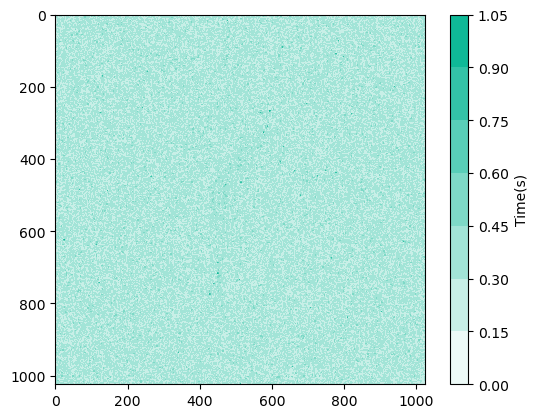

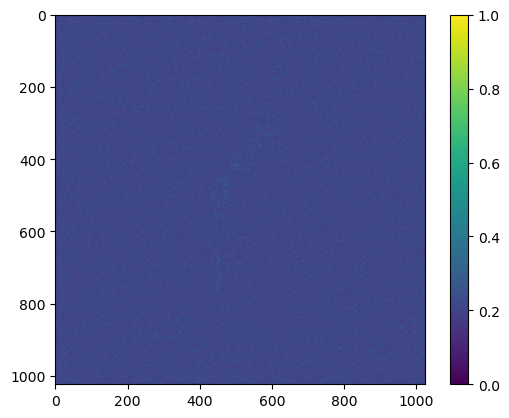

LinAlgError: The data appears to lie in a lower-dimensional subspace of the space in which it is expressed. This has resulted in a singular data covariance matrix, which cannot be treated using the algorithms implemented in `gaussian_kde`. Consider performing principle component analysis / dimensionality reduction and using `gaussian_kde` with the transformed data.

In [451]:
Z4 = np.median(T_1[9:], axis=0)

plt.imshow(Z4, cmap =cmap)

plt.contourf(X, Y, Z4, levels = 7, cmap=cmap, vmax = np.max(Z4))
plt.colorbar(label = 'Time(s)')
    
#plt.savefig("sideWaveAllFish_median.svg")
plt.show()

data_opsin = Z4

plt.imshow(data_opsin)
plt.colorbar()
plt.show()

kde_bottom = gaussian_kde(data_opsin[data_opsin>max_noise])
x_vals_bottom = np.linspace(0, np.max(data_opsin), 200)
kde_vals_bottom = kde_bottom(x_vals_bottom)/np.sum(kde_bottom(x_vals_bottom))

print(np.mean(data_opsin[data_opsin>max_noise]), sem(data_opsin[data_opsin>max_noise]))

# Plot smooth KDE curve
plt.plot(x_vals_bottom, kde_vals_bottom, color="darkred", linewidth=2, label="140nM_f1")

plt.legend()
plt.xlabel("Time (s)")
plt.ylabel("Density")
#plt.xlim(0, 0.6)
#plt.yscale('log')
plt.savefig("140nM_hist_f1.svg")


In [457]:
print(np.mean(data_opsin[data_opsin>max_noise]), sem(data_opsin[data_opsin>max_noise]))


1.0 0.0


### Alignment

100
100
17
100
3
100
50
184


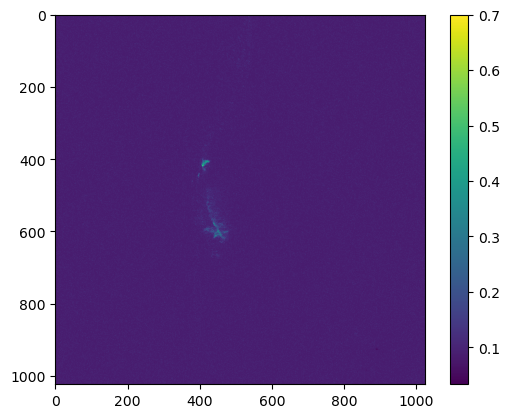

In [459]:
#Align maps by fish
Z = np.array([Z1, Z2, Z3, Z4])
final = Z1

maxima_x = []
maxima_y = []

for i in range(4):
    c_x = []
    c_y = []
    
    for j in range(-100, 100):
        
        c_x.append(np.corrcoef(final.flatten(), np.roll(Z[i,:,:], j, axis=1).flatten())[0,1])
        
    c_x = np.array(c_x)
    max_x = np.argmax(c_x)
    print(max_x)
    maxima_x.append(max_x)
    
    Z[i] = np.roll(Z[i], max_x-100, axis=1)

    for j in range(-100, 100):
        c_y.append(np.corrcoef(final.flatten(), np.roll(T_1[i,:,:], j, axis=0).flatten())[0,1])
        
    c_y = np.array(c_y)
    max_y = np.argmax(c_y)
    print(max_y)
    maxima_y.append(max_y)
    
    Z[i] = np.roll(Z[i], max_y-100, axis=0)

    final =final + Z[i]

plt.imshow(final/len(T_1))
plt.colorbar()


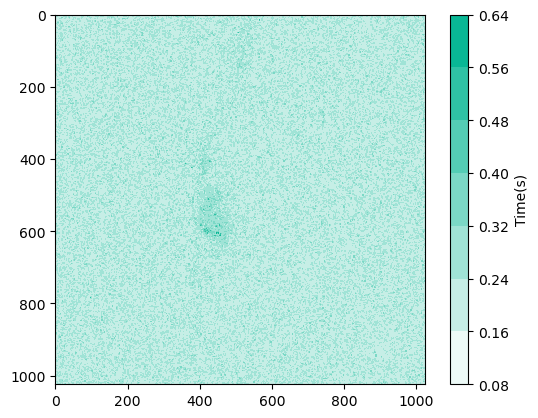

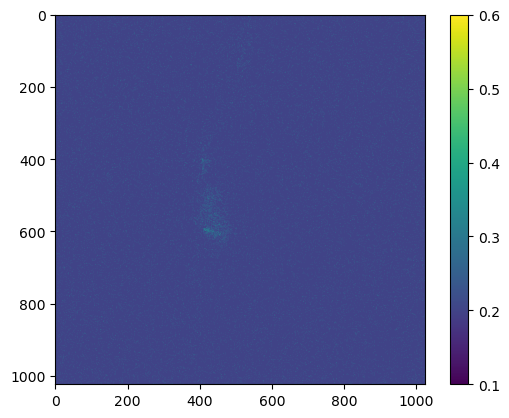

ValueError: `dataset` input should have multiple elements.

In [468]:
Z_7 = np.median(Z, axis=0)

plt.imshow(Z_7, cmap =cmap)

plt.contourf(X, Y, Z_7, levels = 7, cmap=cmap, vmax = np.max(Z_7))
plt.colorbar(label = 'Time(s)')
    
plt.savefig("sideWave_median_7nM.svg")
plt.show()

data_opsin = Z_7

plt.imshow(data_opsin)
plt.colorbar()
plt.show()

kde_bottom = gaussian_kde(data_opsin[data_opsin>max_noise])
x_vals_bottom = np.linspace(0, np.max(data_opsin), 200)
kde_vals_bottom = kde_bottom(x_vals_bottom)/np.sum(kde_bottom(x_vals_bottom))

print(np.mean(data_opsin[data_opsin>max_noise]), sem(data_opsin[data_opsin>max_noise]))

# Plot smooth KDE curve
plt.plot(x_vals_bottom, kde_vals_bottom, color="darkred", linewidth=2, label="7nM")

plt.legend()
plt.xlabel("Time (s)")
plt.ylabel("Density")
#plt.xlim(0, 0.6)
#plt.yscale('log')
plt.savefig("7nM_hist.svg")


In [470]:
data_opsin[data_opsin>max_noise]

array([], dtype=float64)

In [466]:
print(np.mean(data_opsin[data_opsin>max_noise]), sem(data_opsin[data_opsin>max_noise]))


nan nan


/opt/anaconda3/lib/python3.12/site-packages/numpy/core/fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/opt/anaconda3/lib/python3.12/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/opt/anaconda3/lib/python3.12/site-packages/numpy/core/_methods.py:163: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,


## Random

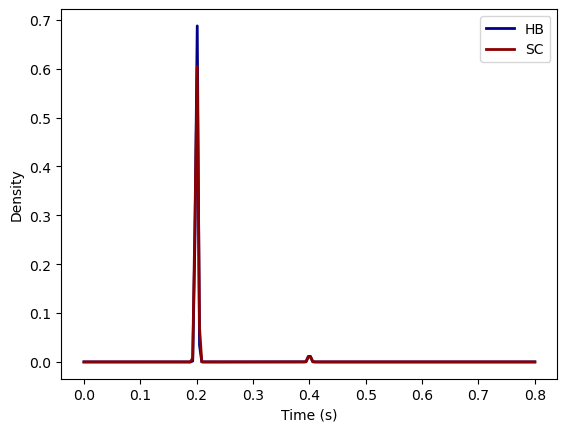

In [91]:
from scipy.stats import gaussian_kde

Z_1median = Z
z_flat_top = Z_1median[250:].flatten()
z_flat_top = z_flat_top[z_flat_top > 0]

data_top = z_flat_top
kde_top = gaussian_kde(data_top)
x_vals_top = np.linspace(0, np.max(data_top), 200)
kde_vals_top = kde_top(x_vals_top)/np.sum(kde_top(x_vals_top))

z_flat_bottom = Z_1median[:250].flatten()
z_flat_bottom = z_flat_bottom[z_flat_bottom > 0]
data_bottom= z_flat_bottom
kde_bottom = gaussian_kde(data_bottom)
x_vals_bottom = np.linspace(0, np.max(data_top), 200)
kde_vals_bottom = kde_bottom(x_vals_bottom)/np.sum(kde_bottom(x_vals_bottom))

# Plot smooth KDE curve
plt.plot(x_vals_top, kde_vals_top, color="darkblue", linewidth=2, label="HB")

# Plot smooth KDE curve
plt.plot(x_vals_bottom, kde_vals_bottom, color="darkred", linewidth=2, label="SC")

plt.legend()
plt.xlabel("Time (s)")
plt.ylabel("Density")
#plt.xlim(0, 0.6)
#plt.yscale('log')
plt.savefig("HBvsSC_side.svg")


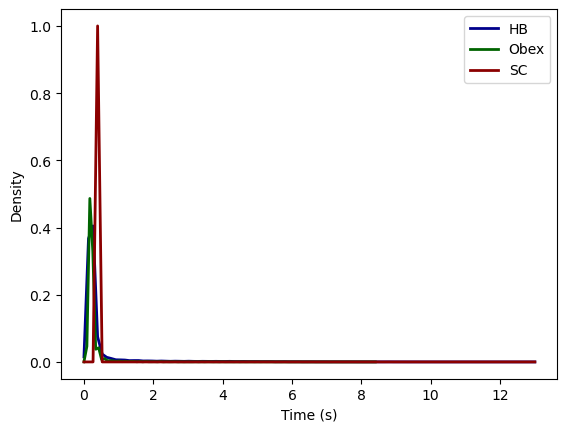

In [77]:
z_flat_top = Z_1median[300:].flatten()
z_flat_top = z_flat_top[z_flat_top > 0]

data_top = z_flat_top
kde_top = gaussian_kde(data_top)
x_vals_top = np.linspace(0, np.max(data_top), 100)
kde_vals_top = kde_top(x_vals_top)/np.sum(kde_top(x_vals_top))

z_flat_middle = Z_1median[200:300].flatten()
z_flat_middle = z_flat_middle[z_flat_middle > 0]

data_middle = z_flat_middle
kde_middle = gaussian_kde(data_middle)
x_vals_middle = np.linspace(0, np.max(data_middle), 100)
kde_vals_middle = kde_middle(x_vals_middle)/np.sum(kde_middle(x_vals_middle))

z_flat_bottom = Z_1median[:200].flatten()
z_flat_bottom = z_flat_bottom[z_flat_bottom > 0]
data_bottom= z_flat_bottom
kde_bottom = gaussian_kde(data_bottom)
x_vals_bottom = np.linspace(0, np.max(data_top), 100)
kde_vals_bottom = kde_bottom(x_vals_bottom)/np.sum(kde_bottom(x_vals_bottom))

# Plot smooth KDE curve
plt.plot(x_vals_top, kde_vals_top, color="darkblue", linewidth=2, label="HB")

plt.plot(x_vals_middle, kde_vals_middle, color="darkgreen", linewidth=2, label="Obex")

# Plot smooth KDE curve
plt.plot(x_vals_bottom, kde_vals_bottom, color="darkred", linewidth=2, label="SC")

plt.legend()
plt.xlabel("Time (s)")
plt.ylabel("Density")
plt.savefig("HBvsOBEXvsSC_side.svg")

In [38]:
final = resized_maps[0]/np.max(resized_maps[0])
maxima = []


T_1 = np.array(resized_maps)

for i in range(0, len(T_1)):
    c = []
    
    for j in range(-300, 300):
        
        c.append(np.corrcoef(final.flatten(), np.roll(T_1[i,:,:], j).flatten())[0,1])

    c = np.array(c)
    max = np.argmax(c)
    print(max)
    maxima.append(max)
    
    final =final + np.roll(T_1[i,:,:], max-300)/np.max(resized_maps[i])

plt.imshow(final/len(T_1))
plt.colorbar()


300
305
287
290
293
288
308


KeyboardInterrupt: 

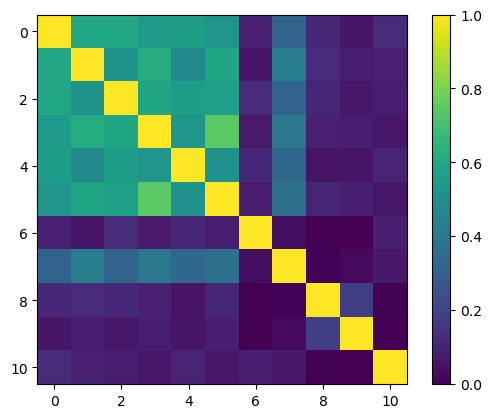

In [77]:
re_T1 = T_1.reshape(len(T_1), -1)
plt.imshow(np.corrcoef(re_T1))
plt.colorbar()

(array([52., 16.,  0., 10.,  4., 24.,  2.,  2.,  0., 11.]),
 array([-0.00153639,  0.09861725,  0.19877088,  0.29892452,  0.39907816,
         0.4992318 ,  0.59938544,  0.69953908,  0.79969272,  0.89984636,
         1.        ]),
 <BarContainer object of 10 artists>)

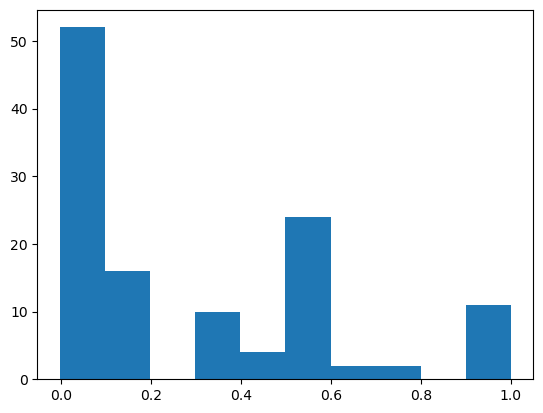

In [85]:
plt.hist(np.corrcoef(re_T1).flatten())

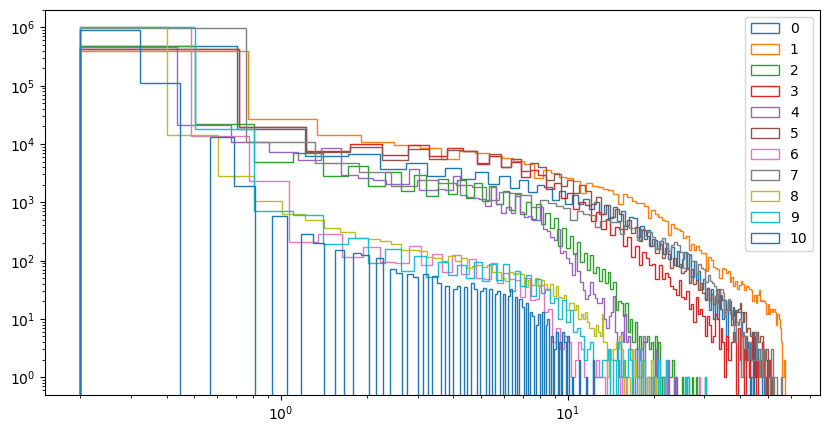

In [81]:
plt.figure(figsize = (10, 5))
for i in range(0, len(T_1)):
    h = T_1[i]
    plt.hist(h[h>0], alpha = 1, bins = 100, histtype = 'step', label = i)

plt.xscale('log')
plt.yscale('log')
plt.legend()

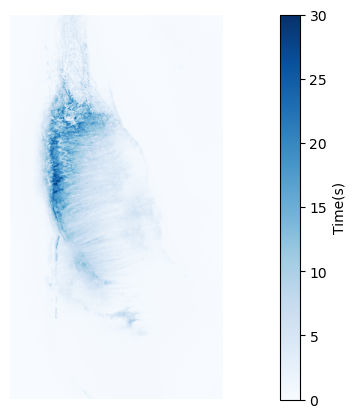

In [29]:
plt.figure(figsize = (15, 5))

plt.imshow(final_ts, vmin = 0, vmax = 30, cmap = 'Blues')
plt.colorbar(label = "Time(s)")
plt.axis('off')
plt.savefig("Glia_Side_smooth.svg")

In [106]:
np.shape(final_ts)

(1008, 556)

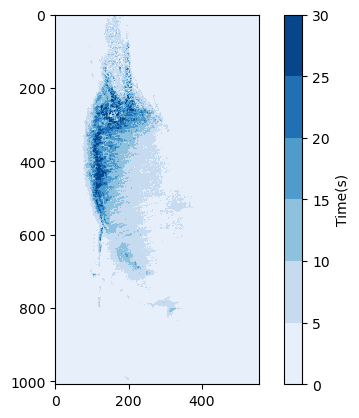

In [31]:
x = np.linspace(0, len(final_ts[0,:]), len(final_ts[0,:]))
y = np.linspace(0, len(final_ts[:,0]), len(final_ts[:,0]))

X, Y = np.meshgrid(x, y)

Z = final_ts

plt.imshow(final_ts, vmin = 0, vmax = 30, cmap = 'Blues')
plt.contourf(X, Y, Z, levels = [0, 5, 10, 15, 20, 25, 30], cmap='Blues', vmax = 30)
plt.colorbar(label = 'Time(s)')
plt.savefig("Glia_Side_bin.svg")

(300.0, 600.0)

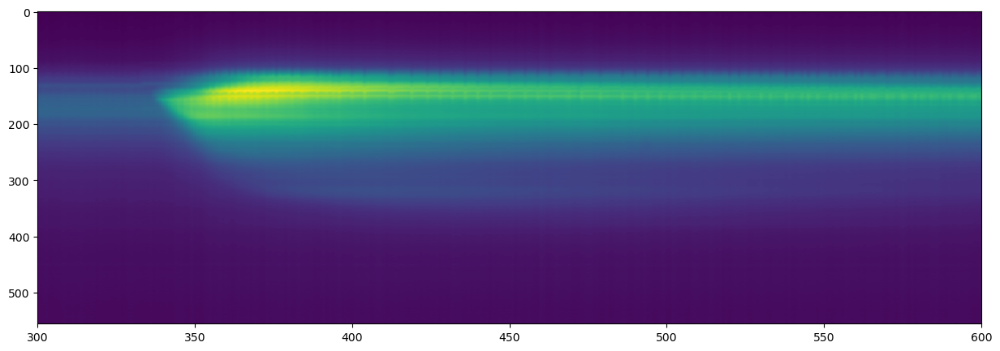

In [13]:
plt.figure(figsize = (15, 5))
plt.imshow(np.mean(WAVES[w], axis = 1).T, aspect = 'auto')
plt.xlim(300, 600)

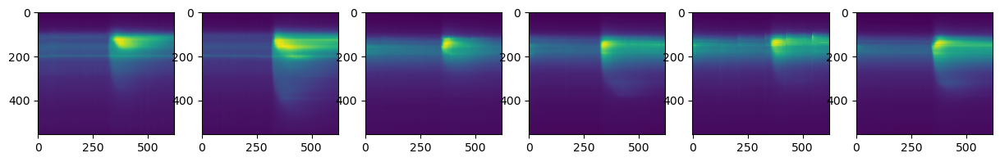

In [30]:
plt.figure(figsize = (15, 5))
for w in range(0, len(WAVES)):
    plt.subplot(1, len(WAVES), w+1)
    plt.imshow(np.mean(WAVES[w], axis = 1).T)


Fraction of pixels above 30s:  0.002040863037109375


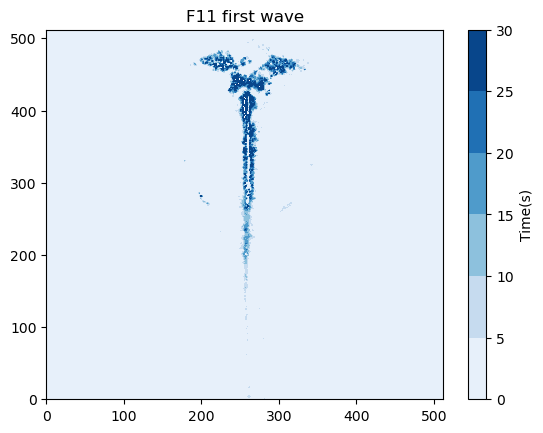

Fraction of pixels above 30s:  0.002044677734375


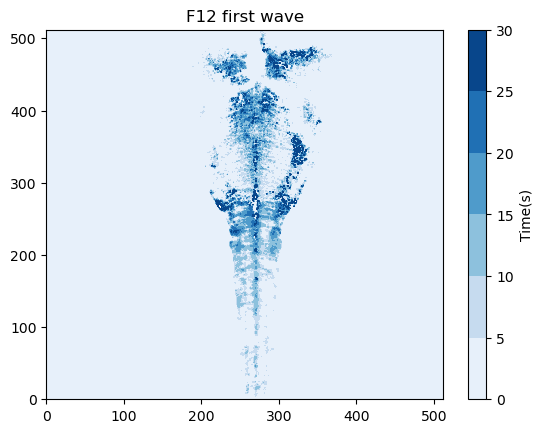

Fraction of pixels above 30s:  0.00144195556640625


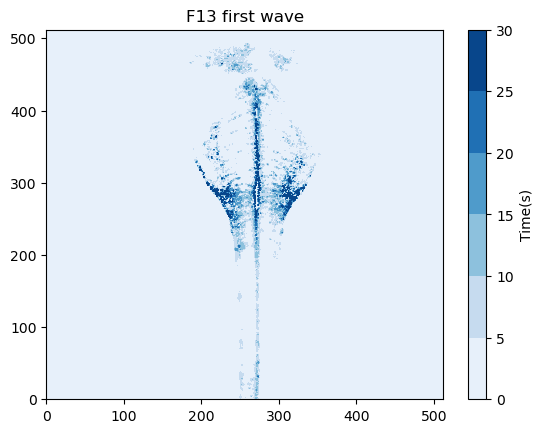

Fraction of pixels above 30s:  0.00026702880859375


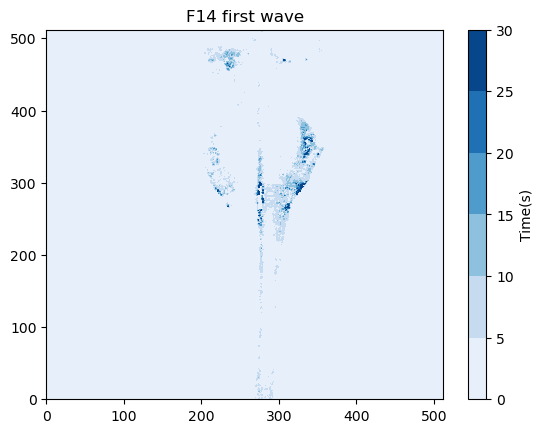

Fraction of pixels above 30s:  0.000209808349609375


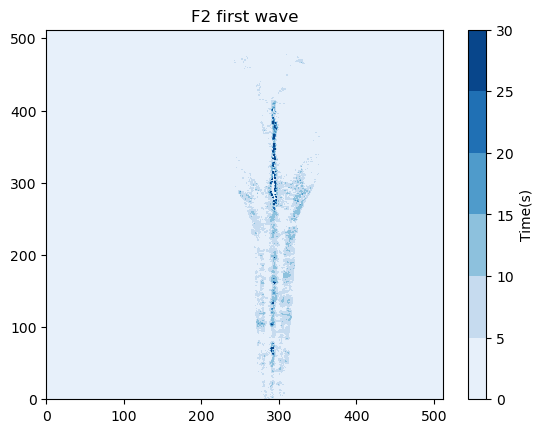

Fraction of pixels above 30s:  0.002346038818359375


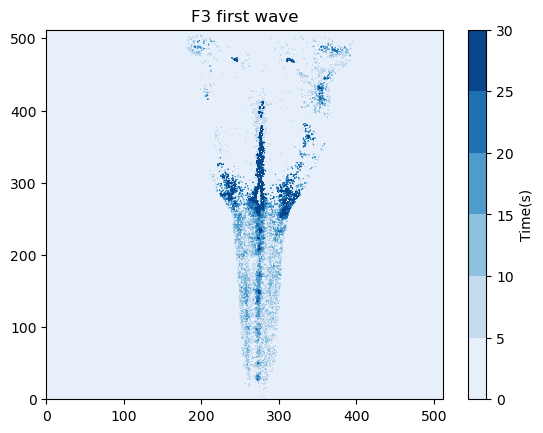

Fraction of pixels above 30s:  0.000919342041015625


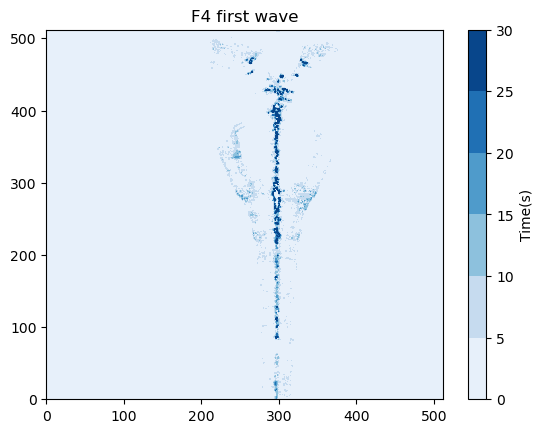

Fraction of pixels above 30s:  0.001316070556640625


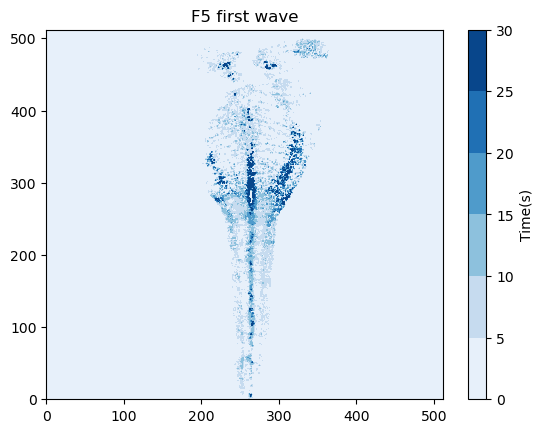

Fraction of pixels above 30s:  0.00315093994140625


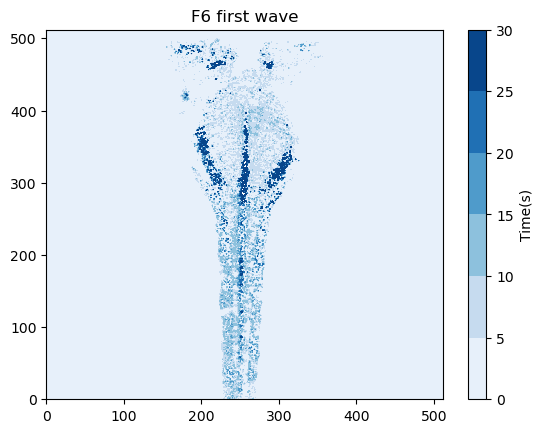

Fraction of pixels above 30s:  0.00167083740234375


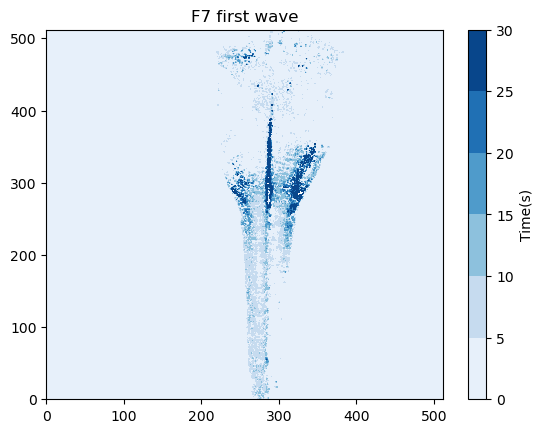

Fraction of pixels above 30s:  0.0006866455078125


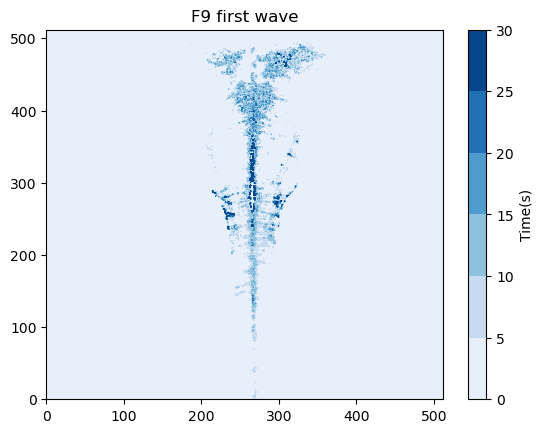

In [12]:
#Plot contour maps

x = np.linspace(0, 512, 512)
y = np.linspace(0, 512, 512)

X, Y = np.meshgrid(x, y)

for i in range(0, len(T_1)):

    Z = T_1[i]
    #Print this to see what is missing by introducing a cutoff in the plot
    print("Fraction of pixels above 30s: ", len(Z[Z>30])/(512**2))
    plt.title(waves[i][:-7] + ' first wave')
    #path = 'wave1/first_wave_contour' + waves[i][:-7] + '.svg'
    
    #plt.imshow(T_1[i], cmap = 'Blues', vmax = 40)
    plt.contourf(X, Y, Z, levels = [0, 5, 10, 15, 20, 25, 30], cmap='Blues', vmax = 30)
    plt.colorbar(label = 'Time(s)')
    
    #plt.savefig(path)
    plt.show()
    


In [15]:
#Alignment and average of the maps


final = T_1[0]
maxima = []


T_1 = np.array(T_1)

for i in range(0, len(T_1)):
    c = []
    
    for j in range(-100, 100):
        
        c.append(np.corrcoef(final.flatten(), np.roll(T_1[i,:,:], j).flatten())[0,1])

    c = np.array(c)
    max = np.argmax(c)
    print(max)
    maxima.append(max)
    
    final =final + np.roll(T_1[i,:,:], max-100)





100
96
89
84
69
86
63
97
107
75
95


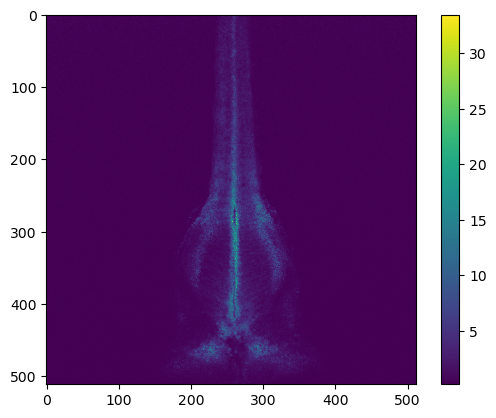

In [17]:
plt.imshow(final/len(T_1))
plt.colorbar()

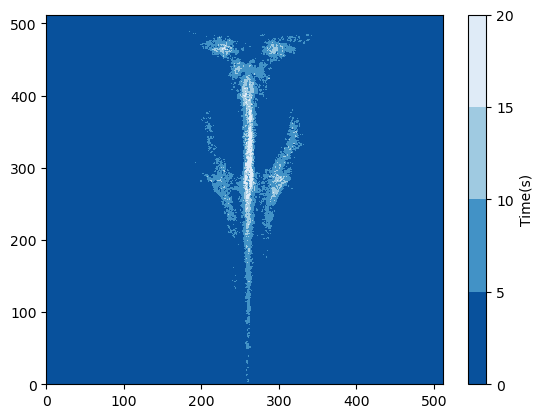

In [53]:
#plt.title(waves[i][:-7] + ' first wave')
path = 'wave1/first_wave_contour' + waves[i][:-7] + '.svg'

Z = final/len(T_1)
    #plt.imshow(T_1[i])
plt.contourf(X, Y, Z, levels = [0, 5, 10, 15, 20], cmap='Blues_r', vmax = 20)
plt.colorbar(label = 'Time(s)')
    
plt.savefig("FirstWaveAllFish.svg")
plt.show()

C2_t2 - 1.tif
C2_t2.tif
C3_t2.tif
C4_t1.tif
C4_t2.tif


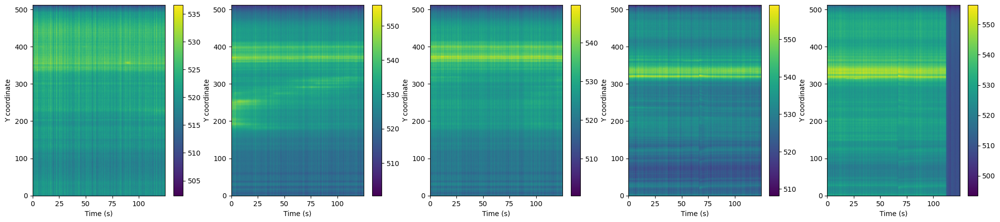

In [35]:
#Input and visualization of the data (x-averaged plots)

path = "control"
waves = np.sort(os.listdir(path))[1:]
len(waves)

WAVES = []
TIMES = []

plt.figure(figsize = (25, 5))
i=1

for filename in np.sort(os.listdir(path))[1:]:

    wave = imread(path + '/' + filename)

    #wave = (wave - np.mean(wave[0:800, :, :]))/np.mean(wave[0:800, :, :])

    times = np.linspace(0,len(wave[:,0,0])*0.2,len(wave[:,0,0])+1)
    times = times[:-1]
    TIMES.append(times)
    
    print(filename) 
    plt.subplot(1, len(waves), i)
    i = i+1
    plt.imshow(np.mean(wave, axis=2).T, aspect='auto', extent=[0, np.max(times), 0, 512])
    plt.colorbar()
    plt.xlabel("Time (s)")
    plt.ylabel("Y coordinate")
    WAVES.append(wave)

/var/folders/1w/c82l1gs16tbfqhkg5hbpwkp00000gp/T/ipykernel_17610/2969240382.py:20: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  tau1[i,j] = half_max_time_r[0] + half_max_time_l[0]


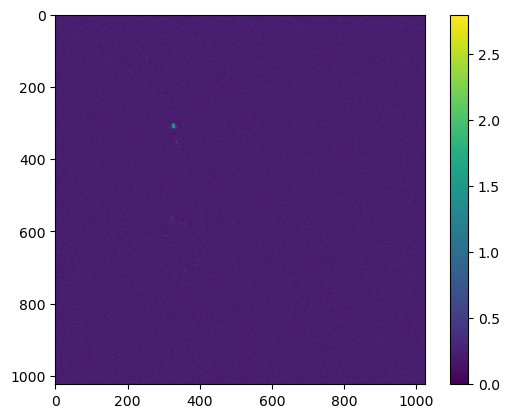

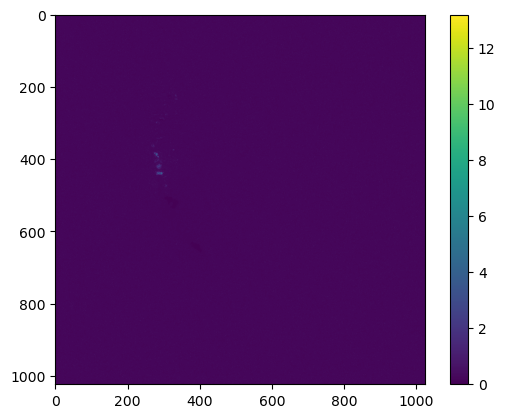

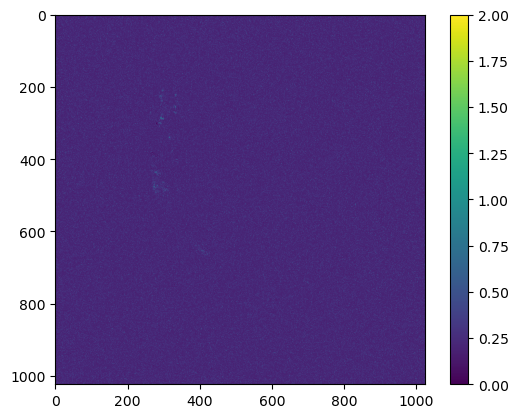

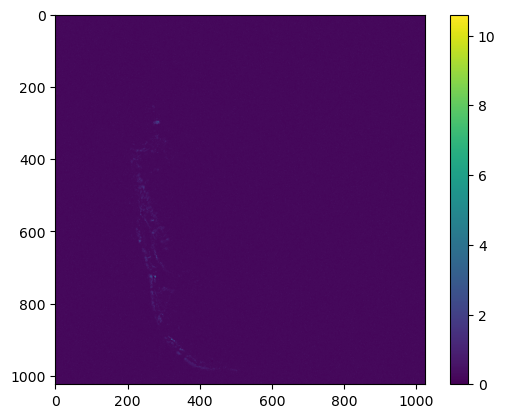

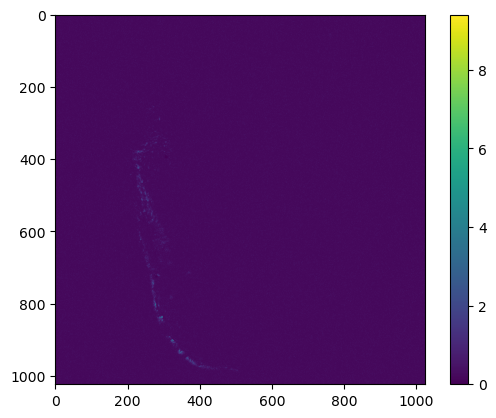

In [37]:
time_maps = []

for w in range(0, len(WAVES)):
    
    tau1 = np.zeros(np.shape(WAVES[w][0, :, :]))
    m1 = np.nanmean(WAVES[w][0:250, :,:], axis = 0)
    #m1 = np.mean(m1)

    for i in range(0, len(WAVES[w][0, :, 0])):
        for j in range(0, len(WAVES[w][0, 0, :])):
                   
            y1 = WAVES[w][300:, i, j] - m1[i,j]
            max_time1 = np.argmax(y1)

            half_max_time_r = np.argwhere(y1[max_time1:] < y1[max_time1]/2)
            half_max_time_l = np.argwhere(y1[:max_time1] < y1[max_time1]/2)

         #Sum the two values to get width at half max
            if(len(half_max_time_r) > 0 and len(half_max_time_l) > 0):
                tau1[i,j] = half_max_time_r[0] + half_max_time_l[0]
            else:
                tau1[i,j] = 0

    tau1[tau1<0] = 0
    tau1[tau1>500] = 0
    tau1 = tau1*0.2

    plt.imshow(tau1)
    plt.colorbar()
    plt.show()

    time_maps.append(tau1)


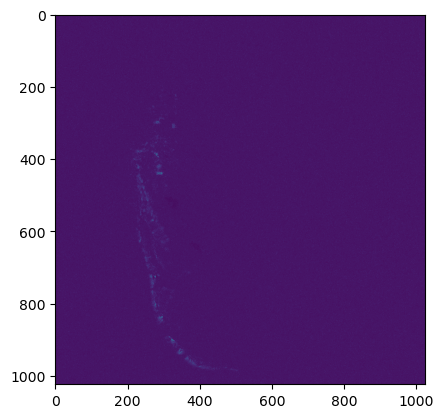

In [41]:
time_maps = np.array(time_maps)

plt.imshow(np.mean(time_maps, axis = 0))

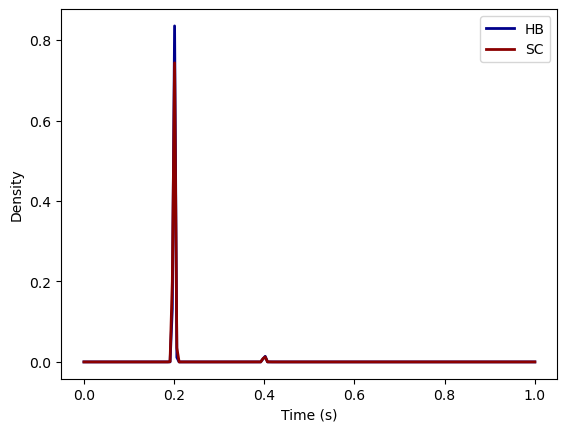

In [57]:
from scipy.stats import gaussian_kde

Z_1median = np.median(time_maps, axis = 0)
z_flat_top = Z_1median[250:].flatten()
z_flat_top = z_flat_top[z_flat_top > 0]

data_top = z_flat_top
kde_top = gaussian_kde(data_top)
x_vals_top = np.linspace(0, np.max(data_top), 200)
kde_vals_top = kde_top(x_vals_top)/np.sum(kde_top(x_vals_top))

z_flat_bottom = Z_1median[:250].flatten()
z_flat_bottom = z_flat_bottom[z_flat_bottom > 0]
data_bottom= z_flat_bottom
kde_bottom = gaussian_kde(data_bottom)
x_vals_bottom = np.linspace(0, np.max(data_top), 200)
kde_vals_bottom = kde_bottom(x_vals_bottom)/np.sum(kde_bottom(x_vals_bottom))

# Plot smooth KDE curve
plt.plot(x_vals_top, kde_vals_top, color="darkblue", linewidth=2, label="HB")

# Plot smooth KDE curve
plt.plot(x_vals_bottom, kde_vals_bottom, color="darkred", linewidth=2, label="SC")

plt.legend()
plt.xlabel("Time (s)")
plt.ylabel("Density")
#plt.xlim(0, 0.6)
#plt.yscale('log')
plt.savefig("HBvsSC_side_control.svg")


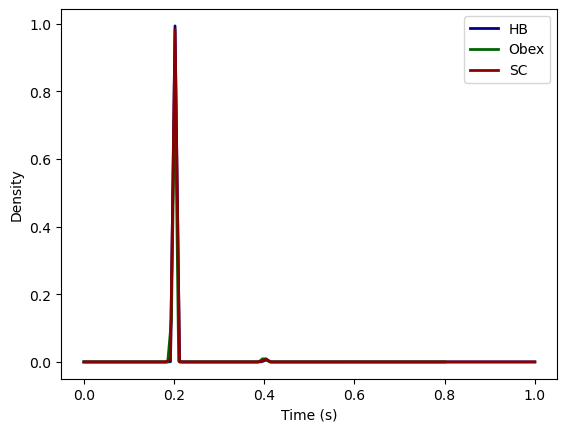

In [59]:
z_flat_top = Z_1median[300:].flatten()
z_flat_top = z_flat_top[z_flat_top > 0]

data_top = z_flat_top
kde_top = gaussian_kde(data_top)
x_vals_top = np.linspace(0, np.max(data_top), 100)
kde_vals_top = kde_top(x_vals_top)/np.sum(kde_top(x_vals_top))

z_flat_middle = Z_1median[200:300].flatten()
z_flat_middle = z_flat_middle[z_flat_middle > 0]

data_middle = z_flat_middle
kde_middle = gaussian_kde(data_middle)
x_vals_middle = np.linspace(0, np.max(data_middle), 100)
kde_vals_middle = kde_middle(x_vals_middle)/np.sum(kde_middle(x_vals_middle))

z_flat_bottom = Z_1median[:200].flatten()
z_flat_bottom = z_flat_bottom[z_flat_bottom > 0]
data_bottom= z_flat_bottom
kde_bottom = gaussian_kde(data_bottom)
x_vals_bottom = np.linspace(0, np.max(data_top), 100)
kde_vals_bottom = kde_bottom(x_vals_bottom)/np.sum(kde_bottom(x_vals_bottom))

# Plot smooth KDE curve
plt.plot(x_vals_top, kde_vals_top, color="darkblue", linewidth=2, label="HB")

plt.plot(x_vals_middle, kde_vals_middle, color="darkgreen", linewidth=2, label="Obex")

# Plot smooth KDE curve
plt.plot(x_vals_bottom, kde_vals_bottom, color="darkred", linewidth=2, label="SC")

plt.legend()
plt.xlabel("Time (s)")
plt.ylabel("Density")
plt.savefig("HBvsOBEXvsSC_side_control.svg")